# **Project Name**    -  Netflix Movies and TV Shows Clustering



##### **Project Type**    - Unsupervised
##### **Contribution**    - Individual

# **Project Summary -**

This dataset consists of tv shows and movies available on Netflix as of 2019. The dataset is collected from Flixable which is a third-party Netflix search engine.

In 2018, they released an interesting report which shows that the number of TV shows on Netflix has nearly tripled since 2010. The streaming service’s number of movies has decreased by more than 2,000 titles since 2010, while its number of TV shows has nearly tripled. It will be interesting to explore what all other insights can be obtained from the same dataset.

In this project, we worked on a text clustering problem where we had to classify/group the Netflix movie/shows into certain clusters such that the shows within a cluster are similar to each other and the shows in different clusters are dissimilar to each other.

# **GitHub Link -**

https://github.com/ad353/Netflix_Movies_and_TV_Shows_Clustering/blob/main/Netflix_Movies_and_TV_Shows_Clustering.ipynb

# **Problem Statement**


Netflix is the world's largest online streaming service provider, with over 247 million subscribers as of 2023-Q3. It is crucial that they effectively cluster the shows that are hosted on their platform in order to enhance the user experience, thereby preventing subscriber churn.

We will be able to understand the shows that are similar to and different from one another by creating clusters, which may be leveraged to offer the consumers personalized show suggestions depending on their preferences.

The goal of this project is to classify/group the Netflix shows into certain clusters such that the shows within a cluster are similar to each other and the shows in different clusters are dissimilar to each other.

# ***Let's Begin !***

## ***1. Know Your Data***

### Import Libraries

In [ ]:
# Import Libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

# Word Cloud library
from wordcloud import WordCloud, STOPWORDS


# libraries used to process textual data
import string
string.punctuation
import nltk
from nltk.corpus import stopwords
nltk.download('stopwords')
nltk.download('wordnet')
nltk.download('omw-1.4')
from nltk.stem.snowball import SnowballStemmer
from nltk.stem import WordNetLemmatizer
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.decomposition import PCA

# libraries used to implement clusters
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.cluster import AgglomerativeClustering
import scipy.cluster.hierarchy as shc


# libraries that are used to construct a recommendation system
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity


sns.set_style('darkgrid')

import warnings
warnings.filterwarnings('ignore')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package omw-1.4 to /root/nltk_data...
[nltk_data]   Package omw-1.4 is already up-to-date!


In [ ]:
pip install --upgrade pip

In [ ]:
pip install --upgrade pillow

### Dataset Loading

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
# Load Dataset
df_netflix=pd.read_csv("/content/drive/MyDrive/Project/Clustering/NETFLIX MOVIES AND TV SHOWS CLUSTERING.csv")

### Dataset First View

In [ ]:
# Dataset First Look
df_netflix.head()

,show_id,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,description
0,s1,TV Show,3%,NaN,"João Miguel, Bianca Comparato, Michel Gomes, R...",Brazil,"August 14, 2020",2020,TV-MA,4 Seasons,"International TV Shows, TV Dramas, TV Sci-Fi &...",In a future where the elite inhabit an island ...
1,s2,Movie,7:19,Jorge Michel Grau,"Demián Bichir, Héctor Bonilla, Oscar Serrano, ...",Mexico,"December 23, 2016",2016,TV-MA,93 min,"Dramas, International Movies",After a devastating earthquake hits Mexico Cit...
2,s3,Movie,23:59,Gilbert Chan,"Tedd Chan, Stella Chung, Henley Hii, Lawrence ...",Singapore,"December 20, 2018",2011,R,78 min,"Horror Movies, International Movies","When an army recruit is found dead, his fellow..."
3,s4,Movie,9,Shane Acker,"Elijah Wood, John C. Reilly, Jennifer Connelly...",United States,"November 16, 2017",2009,PG-13,80 min,"Action & Adventure, Independent Movies, Sci-Fi...","In a postapocalyptic world, rag-doll robots hi..."
4,s5,Movie,21,Robert Luketic,"Jim Sturgess, Kevin Spacey, Kate Bosworth, Aar...",United States,"January 1, 2020",2008,PG-13,123 min,Dramas,A brilliant group of students become card-coun...


### Dataset Rows & Columns count

In [ ]:
# Dataset Rows & Columns count
print("Total no. of rows ",df_netflix.shape[0])
print("Total no. of columns ",df_netflix.shape[1])

Total no. of rows  7787
Total no. of columns  12


### Dataset Information

In [ ]:
# Dataset Info
df_netflix.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7787 entries, 0 to 7786
Data columns (total 12 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   show_id       7787 non-null   object
 1   type          7787 non-null   object
 2   title         7787 non-null   object
 3   director      5398 non-null   object
 4   cast          7069 non-null   object
 5   country       7280 non-null   object
 6   date_added    7777 non-null   object
 7   release_year  7787 non-null   int64 
 8   rating        7780 non-null   object
 9   duration      7787 non-null   object
 10  listed_in     7787 non-null   object
 11  description   7787 non-null   object
dtypes: int64(1), object(11)
memory usage: 730.2+ KB


#### Duplicate Values

In [ ]:
# Dataset Duplicate Value Count
print("There are {} duplicates present.".format(df_netflix.duplicated().sum()))

There are 0 duplicates present.


#### Missing Values/Null Values

In [ ]:
# Missing Values/Null Values Count
df_netflix.isnull().sum()

show_id            0
type               0
title              0
director        2389
cast             718
country          507
date_added        10
release_year       0
rating             7
duration           0
listed_in          0
description        0
dtype: int64

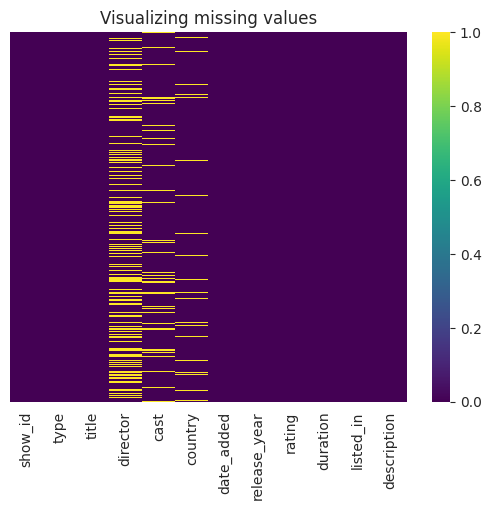

In [ ]:
# Visualizing the missing values
sns.heatmap(df_netflix.isnull(),cmap="viridis",yticklabels=False)
plt.title("Visualizing missing values",fontsize=12)
plt.show()

### What did you know about your dataset?

- Our dataset contains 7787 rows and 12 columns.
- In the director, cast, country, date_added, and rating columns there are missing values.
- The dataset does not contain any duplicate values.

## ***2. Understanding Your Variables***

In [ ]:
# Dataset Columns
df_netflix.columns

Index(['show_id', 'type', 'title', 'director', 'cast', 'country', 'date_added',
       'release_year', 'rating', 'duration', 'listed_in', 'description'],
      dtype='object')

In [ ]:
# Dataset Describe
df_netflix.describe().T

,count,mean,std,min,25%,50%,75%,max
release_year,7787.0,2013.93258,8.757395,1925.0,2013.0,2017.0,2018.0,2021.0


### Variables Description

- show_id : Unique ID for every Movie/Show
- type : Identifier - Movie/Show
- title : Title of the Movie/Show
- director : Director of the Movie/Show
- cast : Actors involved in the Movie/Show
- country : Country where the Movie/Show was produced
- date_added : Date it was added on Netflix
- release_year : Actual Release year of the Movie/Show
- rating : TV Rating of the Movie/Show
- duration : Total Duration - in minutes or number of seasons
- listed_in : Genre
- description : The Summary description

### Check Unique Values for each variable.

In [ ]:
# Check Unique Values for each variable.
for i in df_netflix.columns.tolist():
    print("No. of unique values in",i,"is",df_netflix[i].nunique())

No. of unique values in show_id is 7787
No. of unique values in type is 2
No. of unique values in title is 7787
No. of unique values in director is 4049
No. of unique values in cast is 6831
No. of unique values in country is 681
No. of unique values in date_added is 1565
No. of unique values in release_year is 73
No. of unique values in rating is 14
No. of unique values in duration is 216
No. of unique values in listed_in is 492
No. of unique values in description is 7769


## 3. ***Data Wrangling***

### Data Wrangling Code

In [ ]:
# Assingning numericals column of df to variable numerical_cols
numerical_cols = list(df_netflix.describe())
numerical_df = df_netflix[numerical_cols]
numerical_df.head()

,release_year
0,2020
1,2016
2,2011
3,2009
4,2008


In [ ]:
# Assigning catagoricals column of df to variable catagorical_cols
categorical_cols=list(set(df_netflix.columns)-set(numerical_cols))
categorical_df=df_netflix[categorical_cols]
categorical_df.head()

,description,listed_in,director,title,type,country,show_id,date_added,duration,cast,rating
0,In a future where the elite inhabit an island ...,"International TV Shows, TV Dramas, TV Sci-Fi &...",NaN,3%,TV Show,Brazil,s1,"August 14, 2020",4 Seasons,"João Miguel, Bianca Comparato, Michel Gomes, R...",TV-MA
1,After a devastating earthquake hits Mexico Cit...,"Dramas, International Movies",Jorge Michel Grau,7:19,Movie,Mexico,s2,"December 23, 2016",93 min,"Demián Bichir, Héctor Bonilla, Oscar Serrano, ...",TV-MA
2,"When an army recruit is found dead, his fellow...","Horror Movies, International Movies",Gilbert Chan,23:59,Movie,Singapore,s3,"December 20, 2018",78 min,"Tedd Chan, Stella Chung, Henley Hii, Lawrence ...",R
3,"In a postapocalyptic world, rag-doll robots hi...","Action & Adventure, Independent Movies, Sci-Fi...",Shane Acker,9,Movie,United States,s4,"November 16, 2017",80 min,"Elijah Wood, John C. Reilly, Jennifer Connelly...",PG-13
4,A brilliant group of students become card-coun...,Dramas,Robert Luketic,21,Movie,United States,s5,"January 1, 2020",123 min,"Jim Sturgess, Kevin Spacey, Kate Bosworth, Aar...",PG-13


### What all manipulations have you done and insights you found?

We have divided the dataframe into two dataframes, namely Numerical df and Categorical df.

## ***4. Data Vizualization, Storytelling & Experimenting with charts : Understand the relationships between variables***

#### Chart - 1

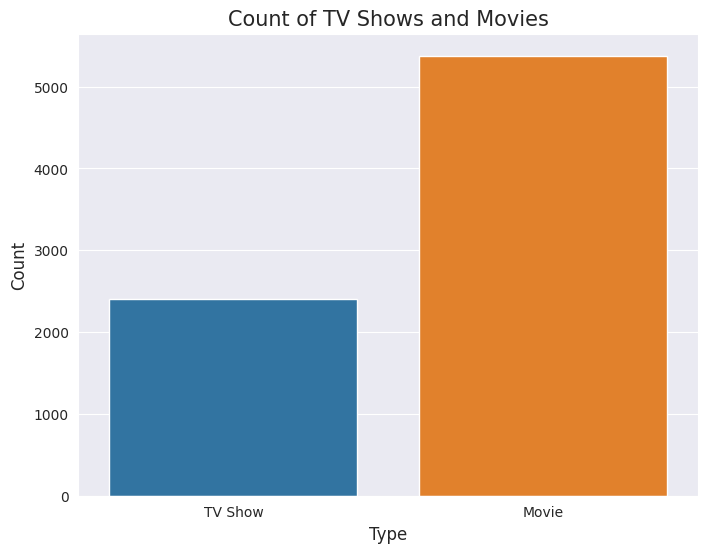

In [ ]:
# Chart - 1 visualization code
plt.figure(figsize=(8,6))
sns.countplot(x='type',data=df_netflix)
plt.title("Count of TV Shows and Movies",fontsize=15)
plt.xlabel('Type',fontsize=12)
plt.ylabel('Count',fontsize=12)
plt.show()

##### 1. Why did you pick the specific chart?

To show distribution of TV Shows and Movies.

##### 2. What is/are the insight(s) found from the chart?

There are more number of movies on Netflix than TV shows.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

For original content production, Netflix can use this data to determine whether to invest more in creating movies or TV shows based on user demand and preferences.

#### Chart - 2

In [ ]:
#!pip install wordcloud

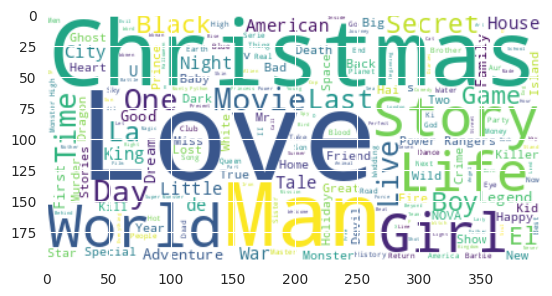

In [ ]:
# Chart - 2 visualization code

# text documents
text = " ".join(word for word in df_netflix['title'])

# create the word cloud using WordCloud library
wordcloud = WordCloud(stopwords=STOPWORDS, background_color='white').generate(text)

# plot the word cloud
plt.imshow(wordcloud,  interpolation='bilinear')
plt.show()

##### 1. Why did you pick the specific chart?

Word clouds help quickly visualize the most frequently occurring words in a text or dataset.

##### 2. What is/are the insight(s) found from the chart?

Words like 'Love', 'Christmas', 'Man', 'World', 'Life', 'Live', and 'Story' are frequently used in the movie title column.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

Understanding popular themes and trends in movie titles.

#### Chart - 3

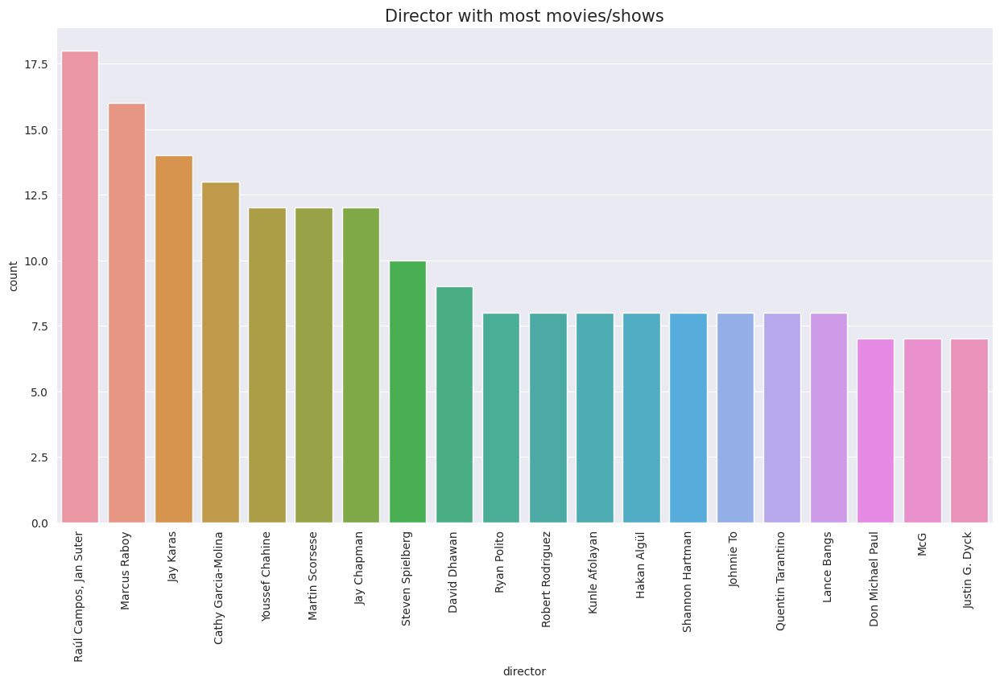

In [ ]:
# Chart - 3 visualization code

plt.figure(figsize = (15,8))
sns.countplot(x='director',data=df_netflix,order=df_netflix.director.value_counts().head(20).index)
plt.title('Director with most movies/shows',fontsize=15)
plt.xticks(rotation = 90)
plt.show()

##### 1. Why did you pick the specific chart?

Countplots allow for easy visual comparison of different categories.

##### 2. What is/are the insight(s) found from the chart?

Raúl Campos, Jan Suter, and Marcus Raboy have directed a larger number of movies/TV shows.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

Understanding which directors have the most experience can inform content acquisition or production decisions. You might choose to work with directors who have a proven track record of directing successful films.

#### Chart - 4

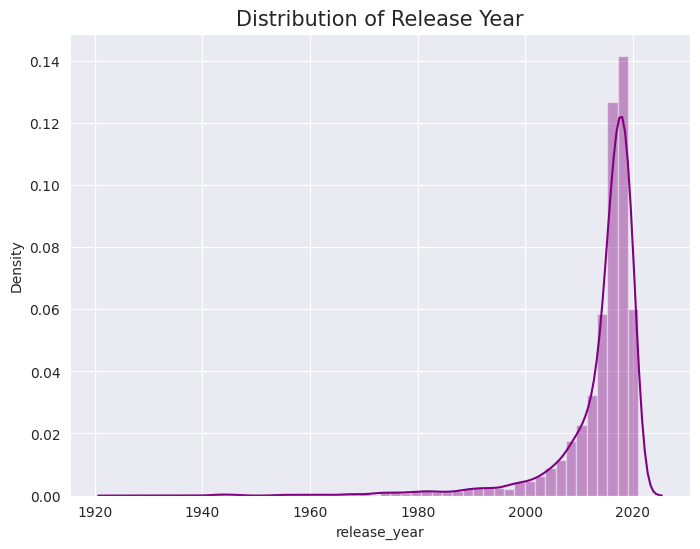

In [ ]:
# Chart - 4 visualization code
plt.figure(figsize=(8,6))
sns.distplot(df_netflix['release_year'],color="purple")
plt.title("Distribution of Release Year",fontsize=15)
plt.show()

##### 1. Why did you pick the specific chart?

This is particularly useful for understanding the central tendency, spread, and shape of the data.By examining the shape of the distplot, we can quickly assess whether the data is symmetric or skewed.

##### 2. What is/are the insight(s) found from the chart?

The chart is left skewed.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

Understanding that the majority of movies were released in a specific time period allows businesses to analyze trends in film production.

#### Chart - 5

In [ ]:
# seperating genre from listed_in columns for analysis purpose
genres = df_netflix['listed_in'].str.split(', ', expand=True).stack().reset_index(level=1, drop=True)

# top 10 genre in listed movie/show
genres = genres.value_counts().reset_index().rename(columns={'index':'genre', 0:'count'})
genres[:10]

,genre,count
0,International Movies,2437
1,Dramas,2106
2,Comedies,1471
3,International TV Shows,1199
4,Documentaries,786
5,Action & Adventure,721
6,TV Dramas,704
7,Independent Movies,673
8,Children & Family Movies,532
9,Romantic Movies,531


In [ ]:
# number of genres present in dataset
len(genres)

42

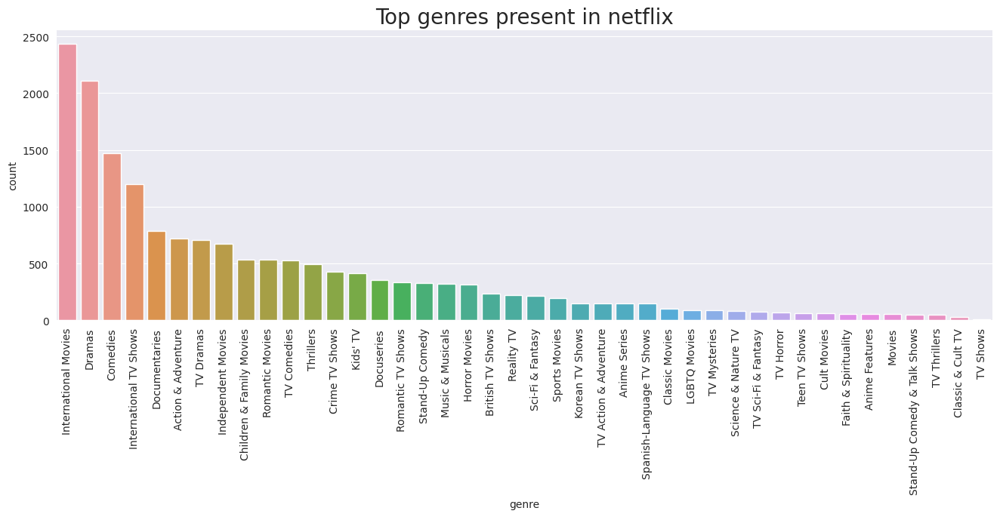

In [ ]:
# plotting graph
plt.figure(figsize=(16,5))
graph = sns.barplot(x='genre', y='count', data=genres)
graph.set_title('Top genres present in netflix', size=20)
plt.xticks(rotation=90)
plt.show()

##### 1. Why did you pick the specific chart?

The genre data consists of distinct categories (genres) and their corresponding counts. Bar plots are well-suited for displaying and comparing the counts or frequencies of different categories.

##### 2. What is/are the insight(s) found from the chart?

The data reveals the popularity of different genres within the dataset. "International Movies" is the most prevalent genre, followed by "Dramas" and "Comedies." This insight can help businesses understand which genres have a significant presence in their content catalog.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

Understanding which genres have the highest counts can inform content acquisition and production strategies. For instance, genres with high counts like "International Movies" and "Dramas" might be areas to focus on.

#### Chart - 6

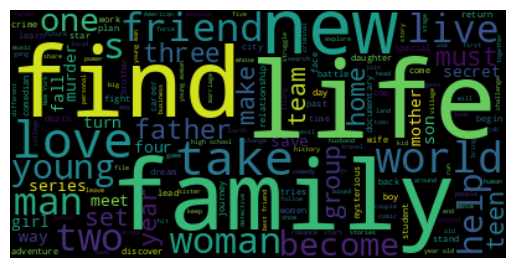

In [ ]:
# Chart - 6 visualization code
# text documents
text = " ".join(word for word in df_netflix['description'])

# create the word cloud
wordcloud = WordCloud(stopwords=STOPWORDS).generate(text)

# plot the word cloud
plt.imshow(wordcloud,  interpolation='bilinear')
plt.axis("off")
plt.show()

##### 1. Why did you pick the specific chart?

Word clouds help quickly visualize the most frequently occurring words in a text or dataset.

##### 2. What is/are the insight(s) found from the chart?

Words like 'family', 'life', 'find', 'take', 'new', 'world', and 'live' are frequently used in the description column.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

Understanding that these words are commonly used in descriptions can help you connect with your target audience on an emotional level. You can use these themes to create content that addresses their interests, needs, and desires.

#### Chart - 7

Text(0, 0.5, 'release_year')

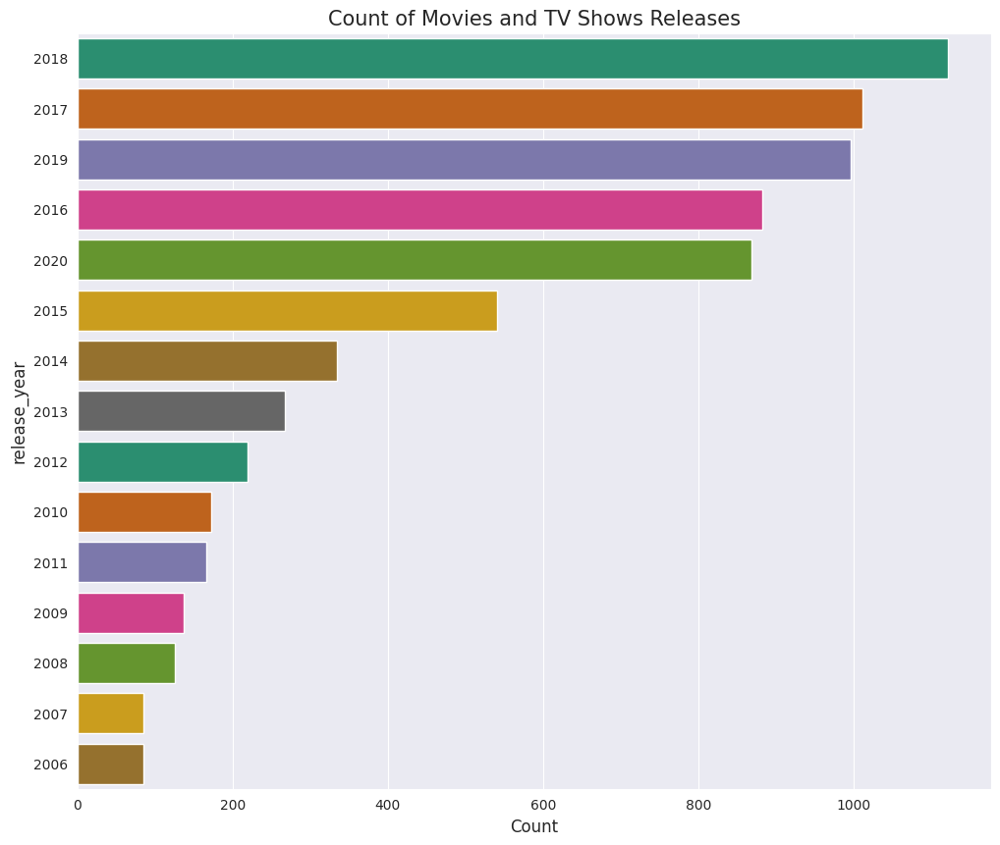

In [ ]:
# Chart - 7 visualization code
plt.figure(figsize=(12,10))
sns.countplot(y="release_year", data=df_netflix, palette="Dark2", order=df_netflix['release_year'].value_counts().index[0:15])
plt.title('Count of Movies and TV Shows Releases',fontsize=15)
plt.xlabel('Count',fontsize=12)
plt.ylabel('release_year',fontsize=12)

##### 1. Why did you pick the specific chart?

Countplots allow for easy comparison between different years. We can quickly see which years had the highest and lowest numbers of movie releases, facilitating insights into trends and patterns.

##### 2. What is/are the insight(s) found from the chart?

2018 had the highest number of movie releases followed by 2017 and 2019.These years can be considered peak years in terms of movie production during this period.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

Production companies can use this information to plan their production schedules, allocate resources, and identify opportunities in years with a higher number of releases.

#### Chart - 8

Text(0.5, 1.0, 'Top 10 director who directed TV Shows')

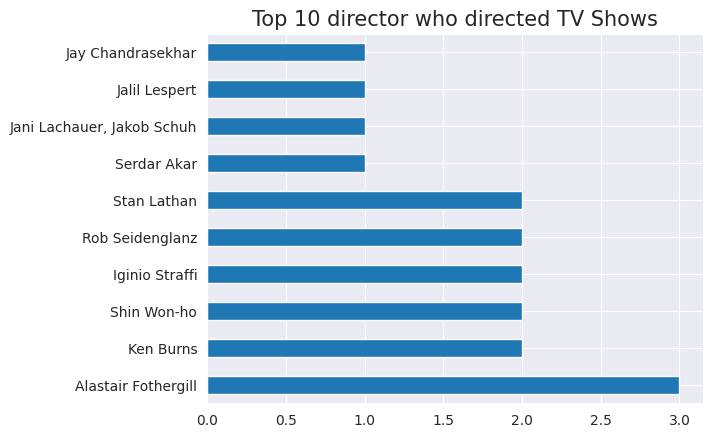

In [ ]:
# Chart - 8 visualization code
# top 10 directors who directed TV shows
tv_shows = df_netflix[df_netflix['type']=='TV Show']['director'].value_counts()[:10].plot(kind='barh')
tv_shows.set_title('Top 10 director who directed TV Shows', size=15)

##### 1. Why did you pick the specific chart?

Barplots are excellent for comparing values across categories or groups. In this case, you can easily compare the number of projects directed by each director, making it clear who has directed more projects.

##### 2. What is/are the insight(s) found from the chart?

Directors with higher counts, such as Alastair Fothergill and Ken Burns, have directed or been associated with multiple projects. This could suggest they are well-established in their respective fields.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

Directors with a proven record of success may be more likely to deliver successful projects.

#### Chart - 9

Text(0.5, 1.0, 'Top 10 director who directed Movies')

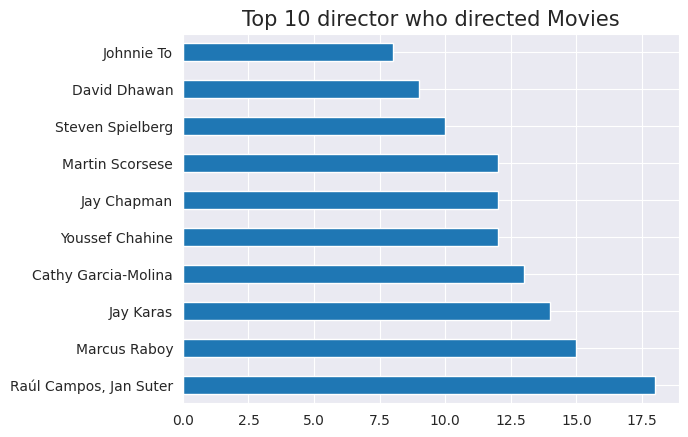

In [ ]:
# Chart - 9 visualization code
# top 10 directors who directed Movies
movies = df_netflix[df_netflix['type']=='Movie']['director'].value_counts()[:10].plot(kind='barh')
movies.set_title('Top 10 director who directed Movies', size=15)

##### 1. Why did you pick the specific chart?

Barplots are excellent for comparing values across categories or groups. In this case, you can easily compare the number of projects directed by each director, making it clear who has directed more projects.

##### 2. What is/are the insight(s) found from the chart?

Directors like Raúl Campos, Jan Suter, and Marcus Raboy, who have higher counts associated with their names, likely have extensive experience due to their involvement in multiple projects, indicating their established presence in their respective fields.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

Directors with a proven record of success may be more likely to deliver successful projects.

#### Chart - 10

Text(0.5, 1.0, 'Top 10 TV shows actors')

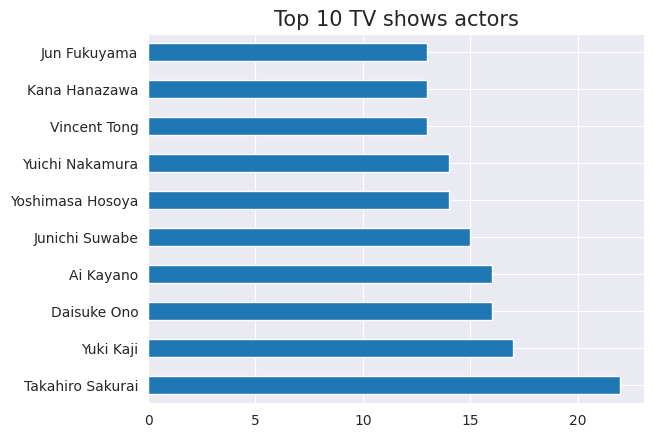

In [ ]:
# Chart - 10 visualization code

top_TVshows_actor = df_netflix[df_netflix['type']=='TV Show']['cast'].str.split(', ', expand=True).stack().value_counts()[:10].plot(kind='barh')
top_TVshows_actor.set_title('Top 10 TV shows actors', size=15)

##### 1. Why did you pick the specific chart?

 Barplots are effective for comparing the values of different categories or groups.

##### 2. What is/are the insight(s) found from the chart?

Takahiro Sakurai and Yuki Kaji have been involved in numerous TV show performances, indicating their extensive experience in the industry.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

Understanding which actors are popular can inform content acquisition and production strategies. Netflix might invest more in shows featuring these actors or negotiate contracts with them to star in exclusive content.

#### Chart - 11

Text(0.5, 1.0, 'Top 10 Movie actors')

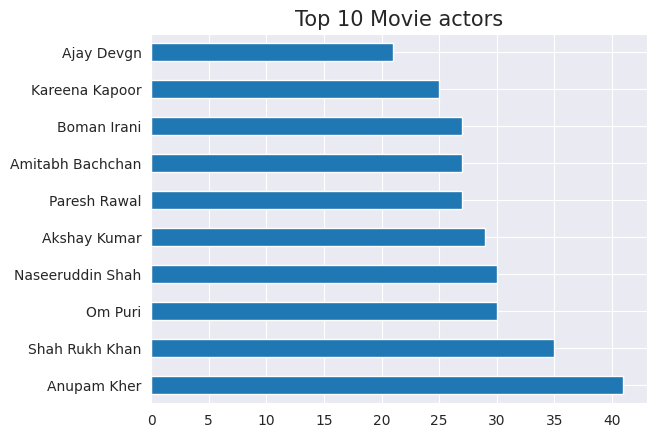

In [ ]:
# Chart - 11 visualization code

top_TVshows_actor = df_netflix[df_netflix['type']=='Movie']['cast'].str.split(', ', expand=True).stack().value_counts()[:10].plot(kind='barh')
top_TVshows_actor.set_title('Top 10 Movie actors', size=15)

##### 1. Why did you pick the specific chart?

 Barplots are effective for comparing the values of different categories or groups.

##### 2. What is/are the insight(s) found from the chart?

Anupam Kher and Shah Rukh Khan performed acting in many movies.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

Knowing which actors are associated with top-performing movies on Netflix can guide casting decisions for future productions. Casting popular actors may attract a larger audience, increase viewership, and potentially lead to higher user satisfaction and retention.

#### Chart - 12

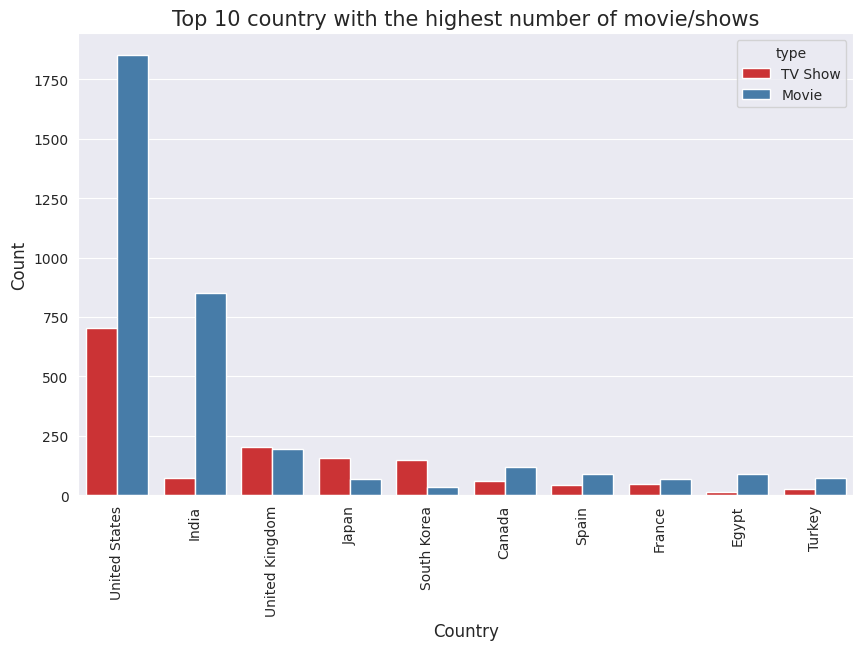

In [ ]:
# Chart - 12 visualization code
plt.figure(figsize=(10,6))
sns.countplot(x="country", data=df_netflix, hue='type',palette='Set1', order=df_netflix['country'].value_counts().index[0:10])
plt.title('Top 10 country with the highest number of movie/shows',fontsize=15)
plt.xlabel('Country',fontsize=12)
plt.ylabel('Count',fontsize=12)
plt.xticks(rotation=90)
plt.show()

##### 1. Why did you pick the specific chart?

 Countplots make it easy to compare the frequencies of different categories.

##### 2. What is/are the insight(s) found from the chart?

The United States clearly leads  with the highest number of movies and shows.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

Understanding which countries produce the most content can guide their expansion strategies. They can prioritize markets with a high number of movies and shows, potentially leading to increased revenue and growth.

#### Chart - 13

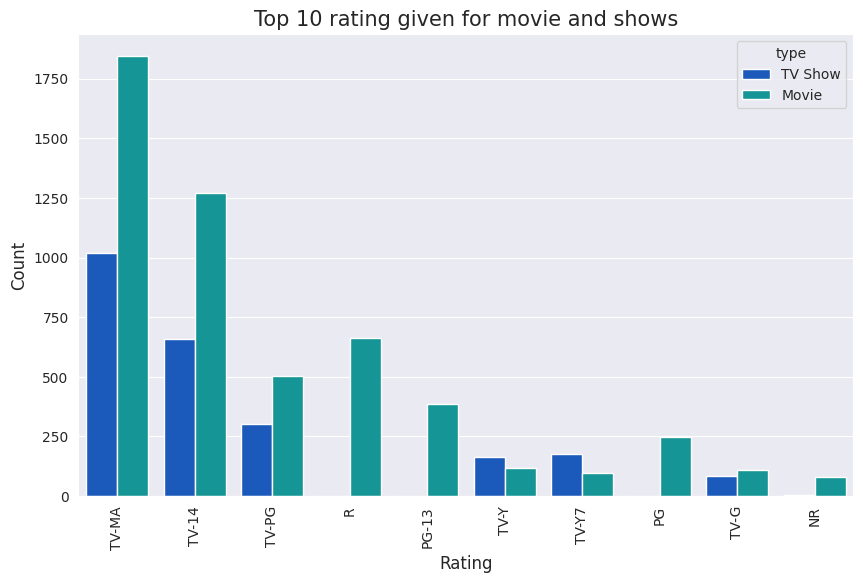

In [ ]:
# Chart - 13 visualization code
plt.figure(figsize=(10,6))
sns.countplot(x=df_netflix['rating'],hue=df_netflix['type'],palette='winter',order=df_netflix['rating'].value_counts().index[0:10])
plt.title('Top 10 rating given for movie and shows',fontsize=15)
plt.xlabel('Rating',fontsize=12)
plt.ylabel('Count',fontsize=12)
plt.xticks(rotation=90)
plt.show()

##### 1. Why did you pick the specific chart?

Countplots allow for quick visual comparisons between categories.

##### 2. What is/are the insight(s) found from the chart?

Most of the movie and tv shows have rating of TV-MA (Mature Audiance) then followed by TV-14 (younger audiance).

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

Streaming platforms can use this data to curate their content libraries better. They can ensure that they have a diverse range of content that caters to different age groups and preferences.

#### Chart - 14

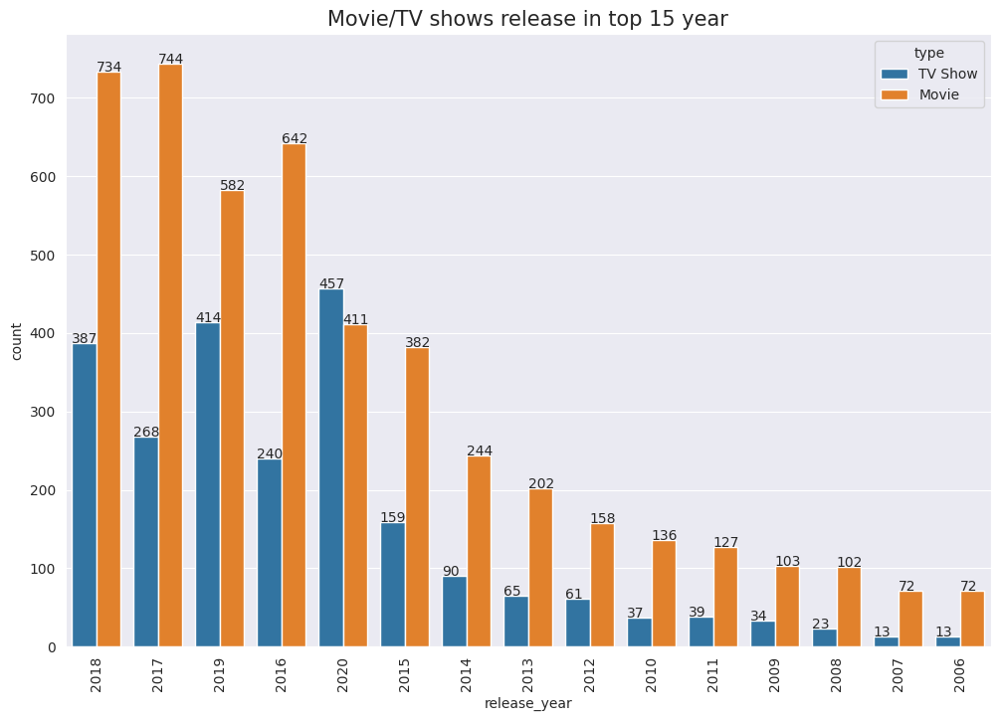

In [ ]:
# Chart - 14 visualization code
plt.figure(figsize=(12,8))
count = sns.countplot(x="release_year", hue='type', data=df_netflix, order=df_netflix['release_year'].value_counts().index[0:15])
count.set_title('Movie/TV shows release in top 15 year', size=15)
plt.xticks(rotation=90)
for p in count.patches:  #adding value count on the top of bar
    count.annotate(format(p.get_height(), '.0f'), (p.get_x(), p.get_height()))

##### 1. Why did you pick the specific chart?

Countplots allow for quick visual comparisons between categories.

##### 2. What is/are the insight(s) found from the chart?

Highest number of movie/shows are relesed in netflix in between 2015-2020 and highest number of count belong from 2018 year.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

Understanding the peak year for content release can help streaming services plan their content calendar to attract and retain subscribers. They might focus on marketing efforts during peak content release periods to maximize viewer engagement.

#### Chart - 15 - Correlation Heatmap

In [ ]:
ratings = {
    'TV-PG': 'Older Kids',
    'TV-MA': 'Adults',
    'TV-Y7-FV': 'Older Kids',
    'TV-Y7': 'Older Kids',
    'TV-14': 'Teens',
    'R': 'Adults',
    'TV-Y': 'Kids',
    'NR': 'Adults',
    'PG-13': 'Teens',
    'TV-G': 'Kids',
    'PG': 'Older Kids',
    'G': 'Kids',
    'UR': 'Adults',
    'NC-17': 'Adults'
}
df_netflix['target_ages'] = df_netflix['rating'].replace(ratings)


In [ ]:
#Preparing data for heatmap
df_netflix['count'] = 1
data = df_netflix.groupby('country')[['country','count']].sum().sort_values(by='count',ascending=False).reset_index()[:10]
data = data['country']

df_heatmap = df_netflix.loc[df_netflix['country'].isin(data)]
df_heatmap = pd.crosstab(df_heatmap['country'],df_heatmap['target_ages'],normalize = "index").T
df_heatmap

country,Canada,Egypt,France,India,Japan,Mexico,South Korea,Spain,United Kingdom,United States
target_ages,,,,,,,,,,
Adults,0.446328,0.277228,0.678261,0.255688,0.364444,0.77,0.469945,0.835821,0.513854,0.501959
Kids,0.180791,0.000000,0.095652,0.016251,0.008889,0.02,0.027322,0.022388,0.093199,0.073276
Older Kids,0.225989,0.039604,0.060870,0.160347,0.271111,0.07,0.120219,0.044776,0.204030,0.187696
Teens,0.146893,0.683168,0.165217,0.567714,0.355556,0.14,0.382514,0.097015,0.188917,0.237069


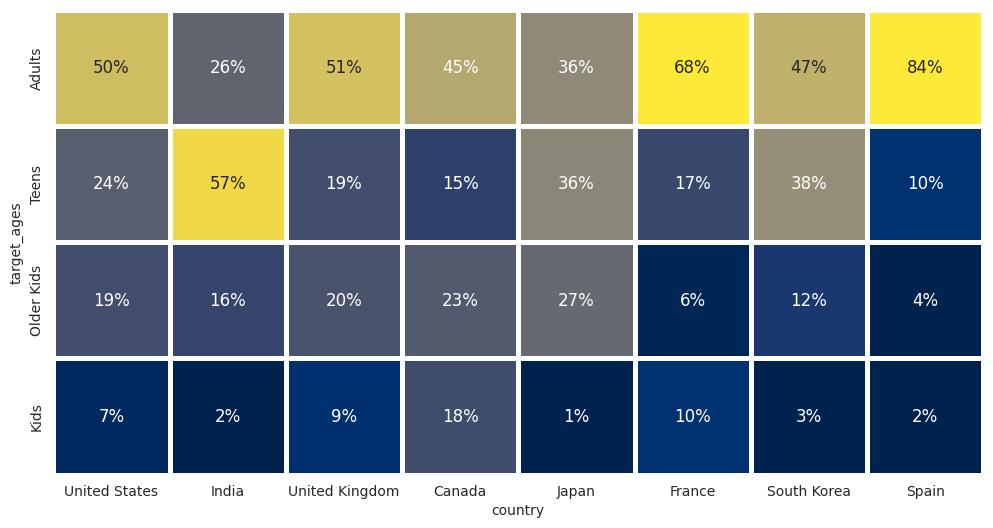

In [ ]:
#Plotting the heatmap
fig, ax = plt.subplots(1, 1, figsize=(12, 12))

country_order2 = ['United States', 'India', 'United Kingdom', 'Canada', 'Japan', 'France', 'South Korea', 'Spain']

age_order = ['Adults', 'Teens', 'Older Kids', 'Kids']

sns.heatmap(df_heatmap.loc[age_order,country_order2],cmap="cividis",square=True, linewidth=2.5,cbar=False,
            annot=True,fmt='1.0%',vmax=.6,vmin=0.05,ax=ax,annot_kws={"fontsize":12})
plt.show()

##### 1. Why did you pick the specific chart?

Heatmaps are a visual representation of data where values in a matrix are represented as colors. The colors in a heatmap indicate the intensity of the values, making it easier to understand patterns, trends, and variations in the data.

##### 2. What is/are the insight(s) found from the chart?

- Each country has its own unique distribution of content across age groups, indicating that content preferences are influenced by cultural and regional factors.
- The distribution of content varies across countries. For example, France and Spain seem to have a higher proportion of content targeted at adults, while Japan has a significant portion of content for older kids and teens.

## ***5. Feature Engineering & Data Pre-processing***

### 1. Handling Missing Values

In [ ]:
# Handling Missing Values & Missing Value Imputation
df_netflix.isna().sum()

show_id            0
type               0
title              0
director        2389
cast             718
country          507
date_added        10
release_year       0
rating             7
duration           0
listed_in          0
description        0
target_ages        7
count              0
dtype: int64

In [ ]:
# Missing Values Percentage
round(df_netflix.isna().sum()/len(df_netflix)*100,2)

show_id          0.00
type             0.00
title            0.00
director        30.68
cast             9.22
country          6.51
date_added       0.13
release_year     0.00
rating           0.09
duration         0.00
listed_in        0.00
description      0.00
target_ages      0.09
count            0.00
dtype: float64

In [ ]:
# Handling Missing Values & Missing Value Imputation
df_netflix[['director','cast','country']]=df_netflix[['director','cast','country']].fillna(' ')
df_netflix.dropna(axis=0,inplace=True)

In [ ]:
# checking for null values after treating them.
df_netflix.isna().sum()

show_id         0
type            0
title           0
director        0
cast            0
country         0
date_added      0
release_year    0
rating          0
duration        0
listed_in       0
description     0
target_ages     0
count           0
dtype: int64

#### What all missing value imputation techniques have you used and why did you use those techniques?

- The empty string can be used to replace the missing values in the director, cast, and country attributes.
- There is a very small percentage of null values in the rating and date_added columns,So we removed null values in the rating and date_added columns .

### 2. Handling Outliers

<Axes: >

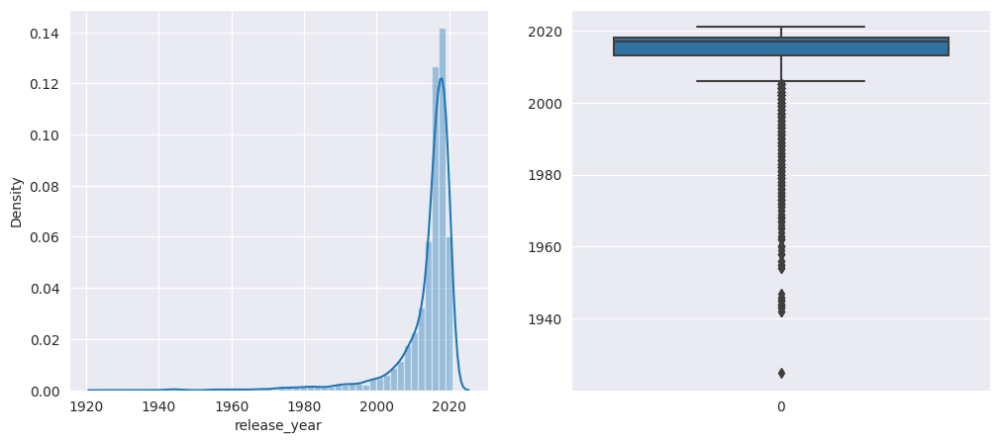

In [ ]:
# Handling Outliers & Outlier treatments
fig,ax = plt.subplots(1,2, figsize=(12,5))
sns.distplot(df_netflix['release_year'],ax=ax[0])
sns.boxplot(df_netflix['release_year'],ax=ax[1])

##### What all outlier treatment techniques have you used and why did you use those techniques?

- Except for the release year, almost all of the data are presented in text format.
- The textual format contains the data we need to build a cluster/building model. Therefore, there is no need to handle outliers.

### 3. Textual Data Preprocessing
(It's mandatory for textual dataset i.e., NLP, Sentiment Analysis, Text Clustering etc.)

In [ ]:
# creating tags column using all text column which one is used for model building purpose.
df_netflix['text_data'] = df_netflix['director'] + df_netflix['cast'] + df_netflix['country'] + \
                     df_netflix['rating'] + df_netflix['listed_in'] + df_netflix['description']

In [ ]:
df_netflix['text_data'][0]

' João Miguel, Bianca Comparato, Michel Gomes, Rodolfo Valente, Vaneza Oliveira, Rafael Lozano, Viviane Porto, Mel Fronckowiak, Sergio Mamberti, Zezé Motta, Celso FrateschiBrazilTV-MAInternational TV Shows, TV Dramas, TV Sci-Fi & FantasyIn a future where the elite inhabit an island paradise far from the crowded slums, you get one chance to join the 3% saved from squalor.'

#### 1.Removing Stop words and Lower Casing.

In natural language processing (NLP) tasks, removing stop words and lowercasing words are common pre-processing steps.

Stop words Removal: Words such as "a," "an," "the," and "is," are words that are commonly used in a language but do not convey much meaning. These words can add noise to the data and can sometimes affect the performance of NLP models, so they are often removed as a pre-processing step.

Lowercasing: It is the process of converting all the words in a text to lowercase. This can be useful in tasks such as information retrieval or text classification where case differences are not important and also can reduce the size of the vocabulary making it easier to work with larger texts or texts in languages with a high number of inflected forms.

In [ ]:
# create a set of English stop words
stop_words = stopwords.words('english')

# displaying stopwords
np.array(stop_words)

array(['i', 'me', 'my', 'myself', 'we', 'our', 'ours', 'ourselves', 'you',
       "you're", "you've", "you'll", "you'd", 'your', 'yours', 'yourself',
       'yourselves', 'he', 'him', 'his', 'himself', 'she', "she's", 'her',
       'hers', 'herself', 'it', "it's", 'its', 'itself', 'they', 'them',
       'their', 'theirs', 'themselves', 'what', 'which', 'who', 'whom',
       'this', 'that', "that'll", 'these', 'those', 'am', 'is', 'are',
       'was', 'were', 'be', 'been', 'being', 'have', 'has', 'had',
       'having', 'do', 'does', 'did', 'doing', 'a', 'an', 'the', 'and',
       'but', 'if', 'or', 'because', 'as', 'until', 'while', 'of', 'at',
       'by', 'for', 'with', 'about', 'against', 'between', 'into',
       'through', 'during', 'before', 'after', 'above', 'below', 'to',
       'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under',
       'again', 'further', 'then', 'once', 'here', 'there', 'when',
       'where', 'why', 'how', 'all', 'any', 'both', 'each', 'few', 'm

In [ ]:
def stopwords(text):
    '''a function for removing the stopword and lowercase the each word'''
    text = [word.lower() for word in text.split() if word.lower() not in stop_words]
    # joining the list of words with space separator
    return " ".join(text)

In [ ]:
# applying stopwords function.
df_netflix['text_data'] = df_netflix['text_data'].apply(stopwords)

In [ ]:
# checking the first row again
df_netflix['text_data'][0]

'joão miguel, bianca comparato, michel gomes, rodolfo valente, vaneza oliveira, rafael lozano, viviane porto, mel fronckowiak, sergio mamberti, zezé motta, celso frateschibraziltv-mainternational tv shows, tv dramas, tv sci-fi & fantasyin future elite inhabit island paradise far crowded slums, get one chance join 3% saved squalor.'

#### 2. Removing Punctuations

In [ ]:
# function to remove punctuations

def remove_punctuation(text):
    '''a function for removing punctuation'''
    import string
    # replacing the punctuations with no space, which in effect deletes the punctuation marks.
    translator = str.maketrans('', '', string.punctuation)
    # return the text stripped of punctuation marks
    return text.translate(translator)

In [ ]:
# applying remove_punctuation function
df_netflix['text_data'] = df_netflix['text_data'].apply(remove_punctuation)

In [ ]:
# checking the first row after the process
df_netflix['text_data'][0]

'joão miguel bianca comparato michel gomes rodolfo valente vaneza oliveira rafael lozano viviane porto mel fronckowiak sergio mamberti zezé motta celso frateschibraziltvmainternational tv shows tv dramas tv scifi  fantasyin future elite inhabit island paradise far crowded slums get one chance join 3 saved squalor'

#### 3.Lemmatization

Lemmatization is a linguistic and natural language processing (NLP) technique that involves reducing words to their base or root form, known as the lemma. The goal of lemmatization is to transform different inflected forms of a word into a common base form. This process helps in standardizing words and reducing them to their canonical or dictionary form, making it easier to analyze and understand text.

In [ ]:
# function to lemmatize the corpus
def lemmatize_verbs(words):
    lemmatizer = WordNetLemmatizer()
    lemmas = []
    for word in words:
        lemma = lemmatizer.lemmatize(word, pos='v')
        lemmas.append(lemma)
    return lemmas

In [ ]:
# Lemmatization
df_netflix['text_data'] = lemmatize_verbs(df_netflix['text_data'])

In [ ]:
# checking the first row after the process
df_netflix['text_data'][0]

'joão miguel bianca comparato michel gomes rodolfo valente vaneza oliveira rafael lozano viviane porto mel fronckowiak sergio mamberti zezé motta celso frateschibraziltvmainternational tv shows tv dramas tv scifi  fantasyin future elite inhabit island paradise far crowded slums get one chance join 3 saved squalor'

#### 4.Text Vectorization

Text vectorization is the process of converting text data into numerical vectors or feature representations that can be used for machine learning or data analysis tasks. In simple terms, it transforms the text data into numerical data which can be easily processed by machine learning algorithms. There are several text vectorization techniques available such as bag of words, Tf-idf, Word2vec, and GloVe etc.

- We will be using the TF-IDF vectorizer, which stands for Term Frequency Inverse Document Frequency
- TF(t) = (Number of times term t appears in a document) / (Total number of terms in the document). The more often a word appears in a document, the higher its TF score.
- IDF(t) = IDF measures how rare a word is across all the documents in the corpus. The rarer a word, the higher its IDF score.
- The product of TF and IDF is used to calculate the overall weight of a word in a document, which is known as the TF-IDF score. Words with high TF-IDF scores are considered to be more important and relevant to the document than words with low TF-IDF scores.

In [ ]:
# create the object of tfid vectorizer
tfidf = TfidfVectorizer(stop_words='english', lowercase=False, max_features = 10000)   # max features = 10000 to prevent system from crashing

# fit the vectorizer using the text data
tfidf.fit(df_netflix['text_data'])

# collect the vocabulary items used in the vectorizer
dictionary = tfidf.vocabulary_.items()

In [ ]:
print(len(dictionary)) #number of independet features created from "text_data" columns

10000


In [ ]:
# convert vector into array form for clustering
vector = tfidf.transform(df_netflix['text_data']).toarray()

# summarize encoded vector
print(vector)
print(f'shape of the vector : {vector.shape}')
print(f'datatype : {type(vector)}')

[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
shape of the vector : (7770, 10000)
datatype : <class 'numpy.ndarray'>


### 4. Dimesionality Reduction

Dimensionality reduction is the process of reducing the number of features or dimensions in a dataset while retaining as much information as possible. The main goal of dimensionality reduction is to simplify the data while minimizing the loss of information. It is a crucial step in machine learning and data analysis as it can help to improve the performance of models, reduce overfitting, and make it easier to visualize and interpret the data.

- There are several techniques used for dimensionality reduction, such as: Principal Component Analysis (PCA), Linear Discriminant Analysis (LDA), t-Distributed Stochastic Neighbor Embedding (t-SNE), Autoencoder, and Random Projection etc.
- We will use Principal Component Analysis (PCA) to reduce the dimensionality of data.

In [ ]:
# DImensionality Reduction (If needed)
# using PCA to reduce dimensionality
pca = PCA(random_state=42)
pca.fit(vector)

PCA(random_state=42)

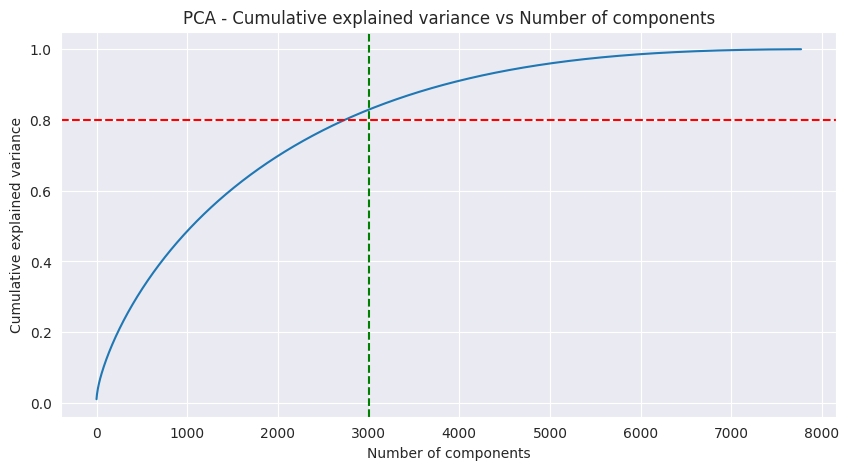

In [ ]:
# Explained variance for different number of components
plt.figure(figsize=(10,5))
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.title('PCA - Cumulative explained variance vs Number of components')
plt.xlabel('Number of components')
plt.ylabel('Cumulative explained variance')
plt.axhline(y= 0.8, color='red', linestyle='--')
plt.axvline(x= 3000, color='green', linestyle='--')
plt.show()

- We discover that approximately 7500 components account for 100 percent of the variance.
- 3000 components alone account for more than 80% of the variance.
- Therefore, we can take the top 3000 components to reduce dimensionality and simplify the model while still being able to capture more than 80% of the variance.

In [ ]:
# reducing the dimensions to 3000 using pca
pca = PCA(n_components=3000, random_state=42)
pca.fit(vector)

PCA(n_components=3000, random_state=42)

In [ ]:
# transformed features
X = pca.transform(vector)

# shape of transformed vectors
X.shape

(7770, 3000)

## ***6. ML Model Implementation***

### ML Model - KMeans Clustering

K-means clustering is a popular unsupervised machine learning algorithm used for partitioning a dataset into K distinct, non-overlapping subsets (clusters). The goal of k-means is to assign each data point to a cluster in a way that minimizes the total sum of squared distances from each point to the centroid (center) of its assigned cluster.

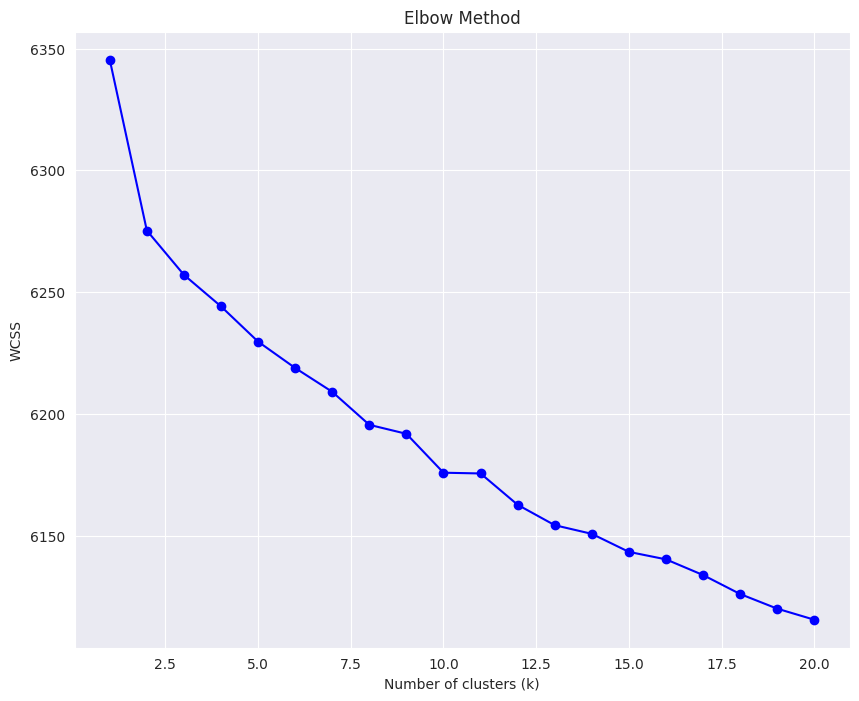

In [ ]:
wcss = []
for k in range(1, 21):  # Try k values from 1 to 10 clusters
    kmeans = KMeans(n_clusters=k, init='k-means++', max_iter=300, n_init=10, random_state=0)
    kmeans.fit(X)
    wcss.append(kmeans.inertia_)

# Plot the WCSS values to find the elbow
plt.figure(figsize=(10, 8))
plt.plot(range(1, 21), wcss, marker='o', linestyle='-', color='b')
plt.title('Elbow Method')
plt.xlabel('Number of clusters (k)')
plt.ylabel('WCSS')
plt.grid(True)
plt.show()

- We plot the WCSS values for different values of k, and the "elbow" in the plot corresponds to the optimal number of clusters.

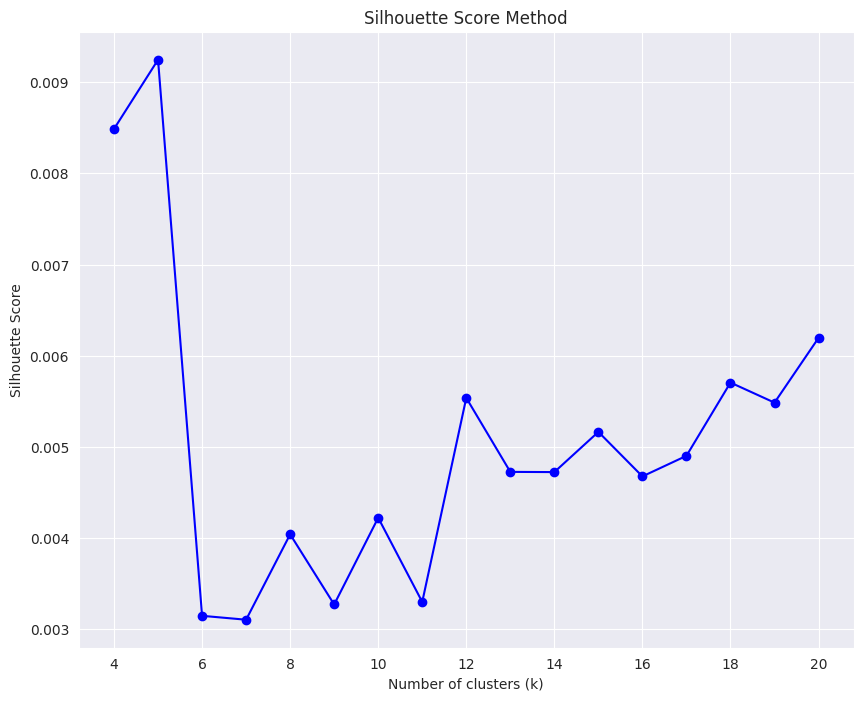

In [ ]:
silhouette_scores = []
for k in range(4, 21):  # Try k values from 2 to 10 clusters
    kmeans = KMeans(n_clusters=k, init='k-means++', max_iter=300, n_init=10, random_state=0)
    cluster_labels = kmeans.fit_predict(X)
    silhouette_avg = silhouette_score(X, cluster_labels)
    silhouette_scores.append(silhouette_avg)

# Plot the silhouette scores
plt.figure(figsize=(10, 8))
plt.plot(range(4, 21), silhouette_scores, marker='o', linestyle='-', color='b')
plt.title('Silhouette Score Method')
plt.xlabel('Number of clusters (k)')
plt.ylabel('Silhouette Score')
plt.grid(True)
plt.show()

- We calculate the silhouette score using the silhouette_score function from scikit-learn. The silhouette score measures how similar an object is to its own cluster compared to other clusters. A higher silhouette score indicates better separation of clusters.

Optimal number of cluster is 5

In [ ]:
# Clustering the data into 5 clusters
kmeans = KMeans(n_clusters=5, init='k-means++', random_state=35)
kmeans.fit(X)

KMeans(n_clusters=5, random_state=35)

In [ ]:
# Evaluation metrics - distortion, Silhouette score
kmeans_distortion = kmeans.inertia_
kmeans_silhouette_score = silhouette_score(X, kmeans.labels_)

print((kmeans_distortion, kmeans_silhouette_score))

(6232.3865485142915, 0.007577074332298183)


In [ ]:
# Adding a kmeans cluster number attribute
df_netflix['kmeans_cluster'] = kmeans.labels_

In [ ]:
df_netflix.sample(4)[['type', 'title', 'director', 'cast', 'country', 'rating', 'listed_in', 'description', 'kmeans_cluster']]

,type,title,director,cast,country,rating,listed_in,description,kmeans_cluster
582,Movie,ARQ,Tony Elliott,"Robbie Amell, Rachael Taylor, Shaun Benson, Gr...","Canada, United States",TV-MA,"International Movies, Sci-Fi & Fantasy, Thrillers","Trapped in a lab and stuck in a time loop, a d...",1
3263,TV Show,K-On!,,"Aki Toyosaki, Ayana Taketatsu, Chika Fujito, M...",Japan,TV-PG,"Anime Series, Teen TV Shows",When they're not gorging themselves on sugary ...,1
3145,Movie,Jen Kirkman: I'm Gonna Die Alone (And I Feel F...,Lance Bangs,Jen Kirkman,United States,TV-MA,Stand-Up Comedy,"Jen Kirkman delivers some sharp, hilarious tru...",1
6594,Movie,The Life Ahead,Edoardo Ponti,"Sophia Loren, Ibrahima Gueye, Renato Carpentie...",Italy,PG-13,"Dramas, International Movies",A Holocaust survivor running a daycare busines...,3


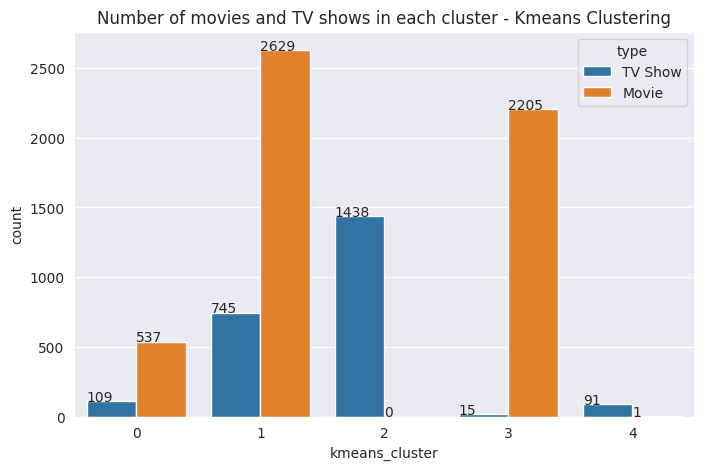

In [ ]:
# Number of movies and tv shows in each cluster
plt.figure(figsize=(8,5))
graph = sns.countplot(x='kmeans_cluster',data=df_netflix, hue='type')
plt.title('Number of movies and TV shows in each cluster - Kmeans Clustering')

# adding value count on the top of bar
for p in graph.patches:
  graph.annotate(format(p.get_height(), '.0f'), (p.get_x(), p.get_height()))

#### Building wordclouds for different clusters in K-Means Clustering

In [ ]:
def kmeans_worldcloud(cluster_number, column_name):

  '''function for Building a wordcloud for the movie/shows'''

  df_netflix_wordcloud = df_netflix[['kmeans_cluster',column_name]].dropna()
  df_netflix_wordcloud = df_netflix_wordcloud[df_netflix_wordcloud['kmeans_cluster']==cluster_number]

  # text documents
  text = " ".join(word for word in df_netflix_wordcloud[column_name])

  # create the word cloud
  wordcloud = WordCloud(stopwords=set(STOPWORDS), background_color="white").generate(text)

  # Generate a word cloud image
  plt.imshow(wordcloud, interpolation='bilinear')
  plt.axis("off")
  plt.show()

In [ ]:
df_netflix.columns

Index(['show_id', 'type', 'title', 'director', 'cast', 'country', 'date_added',
       'release_year', 'rating', 'duration', 'listed_in', 'description',
       'target_ages', 'count', 'text_data', 'kmeans_cluster'],
      dtype='object')

#### Word Cloud on "title" column for different cluster

cluster 0


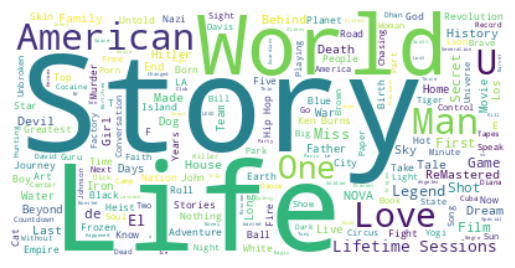

cluster 1


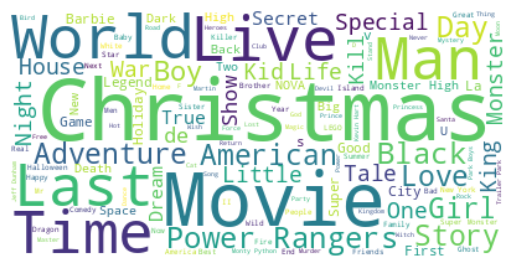

cluster 2


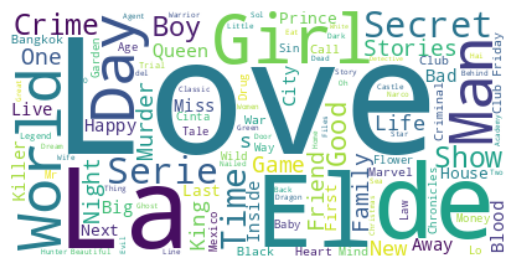

cluster 3


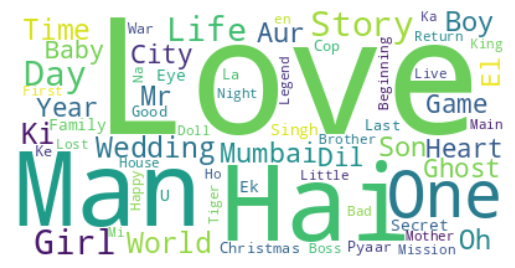

cluster 4


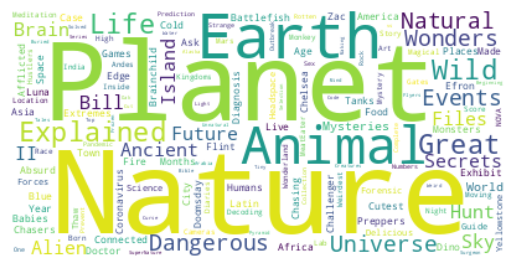

In [ ]:
for i in range(5):
    print(f'cluster {i}')
    kmeans_worldcloud(i,'title')

#### Word Cloud on "director" column for different cluster

cluster 0


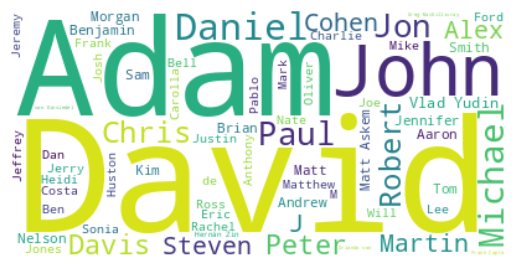

cluster 1


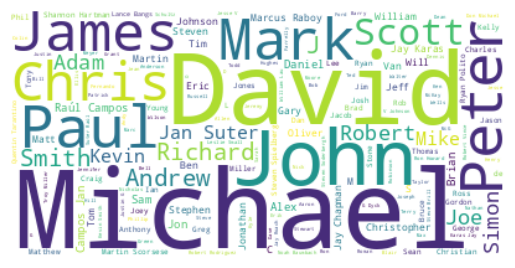

cluster 2


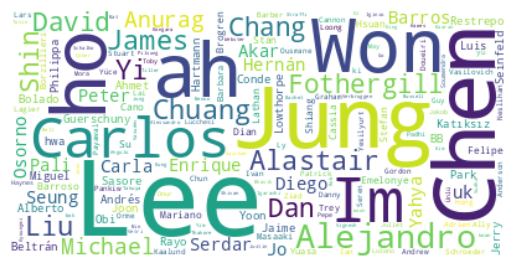

cluster 3


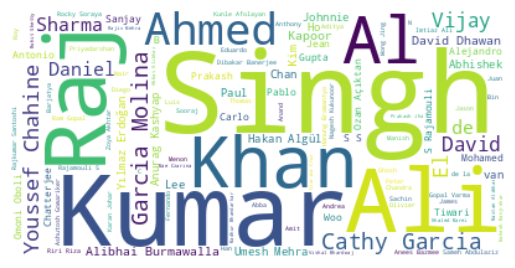

cluster 4


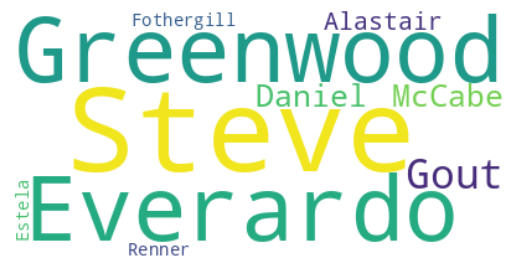

In [ ]:
for i in range(5):
    print(f'cluster {i}')
    kmeans_worldcloud(i,'director')

#### Word Cloud on "cast" column for different cluster

cluster 0


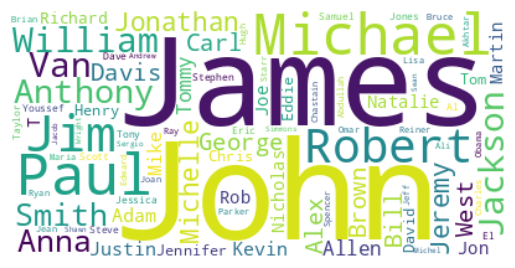

cluster 1


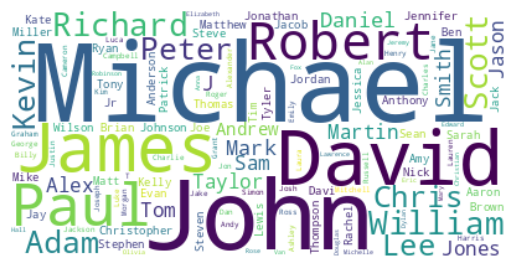

cluster 2


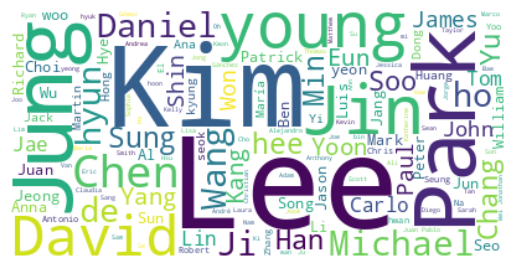

cluster 3


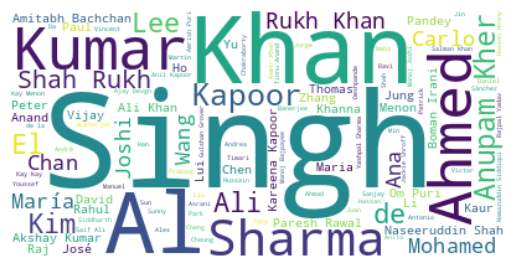

cluster 4


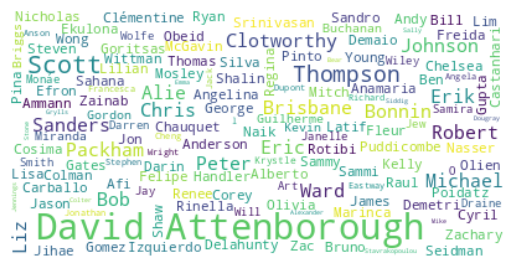

In [ ]:
for i in range(5):
    print(f'cluster {i}')
    kmeans_worldcloud(i,'cast')

#### Word Cloud on "country" column for different cluster

cluster 0


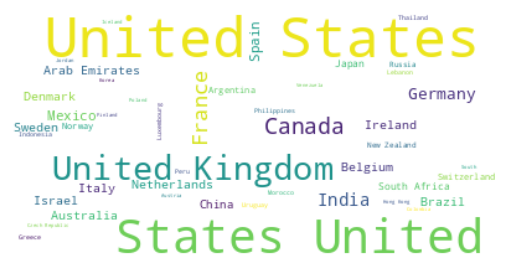

cluster 1


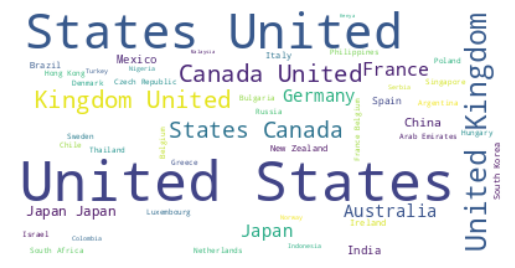

cluster 2


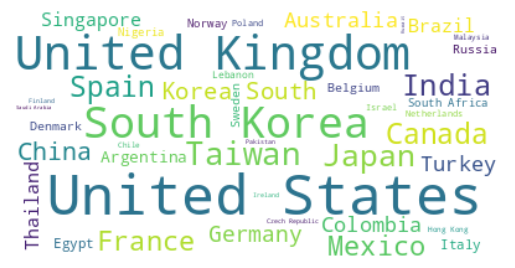

cluster 3


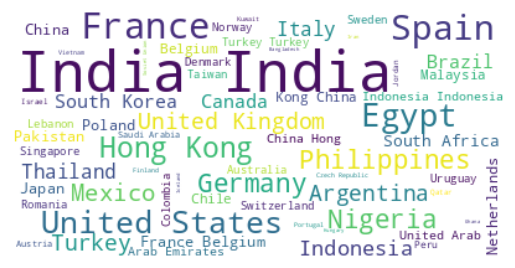

cluster 4


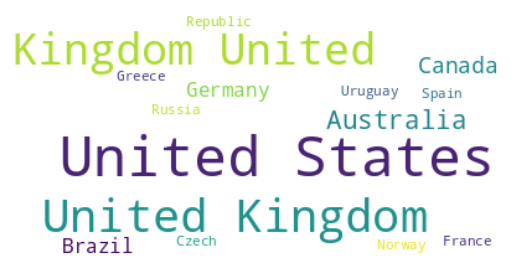

In [ ]:
for i in range(5):
    print(f'cluster {i}')
    kmeans_worldcloud(i,'country')

#### Word Cloud on "listed_in" column for different cluster

cluster 0


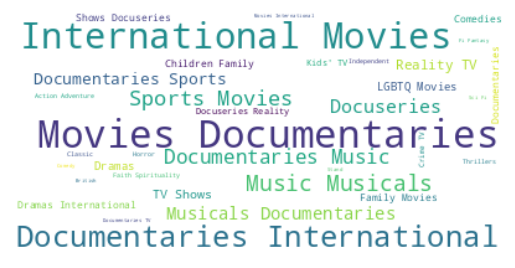

cluster 1


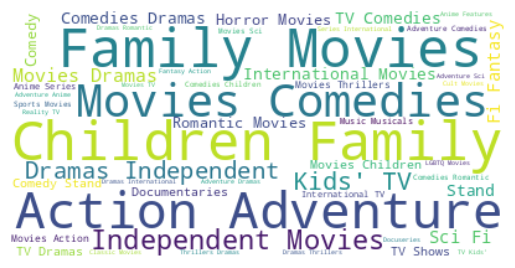

cluster 2


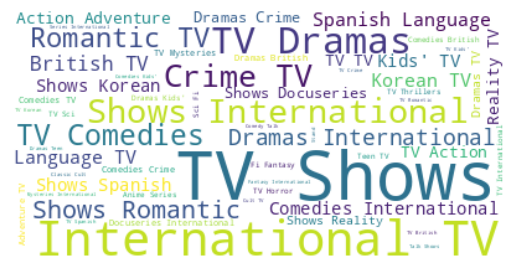

cluster 3


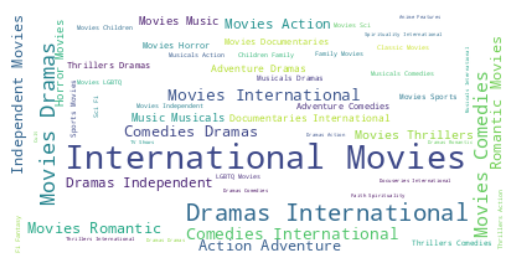

cluster 4


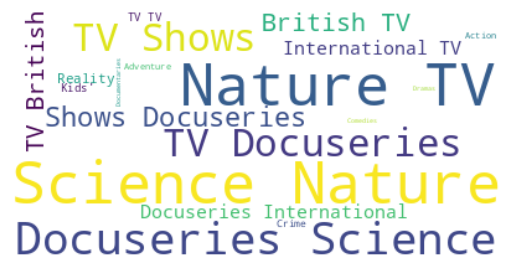

In [ ]:
for i in range(5):
    print(f'cluster {i}')
    kmeans_worldcloud(i,'listed_in')

#### Word Cloud on "description" column for different cluster

cluster 0


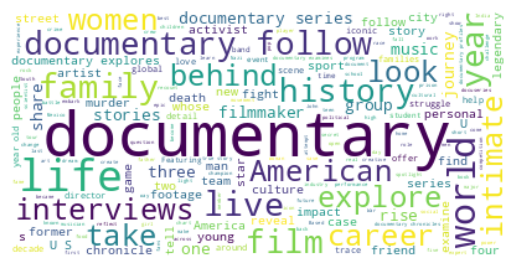

cluster 1


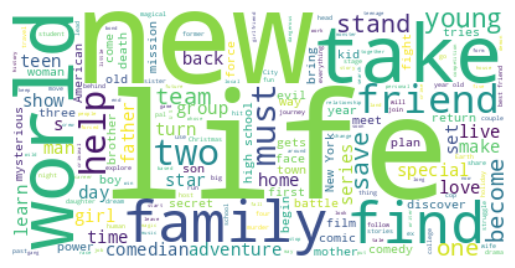

cluster 2


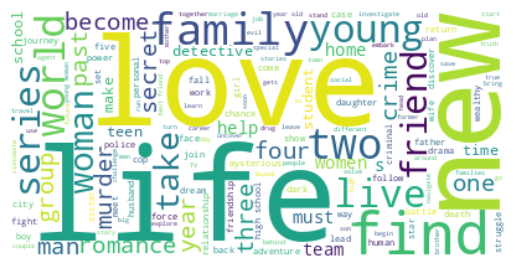

cluster 3


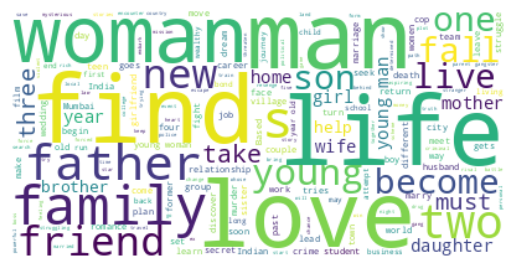

cluster 4


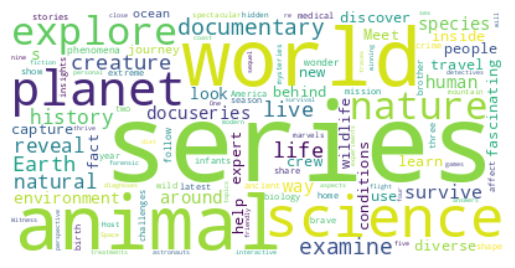

In [ ]:
for i in range(5):
    print(f'cluster {i}')
    kmeans_worldcloud(i,'description')

### ML Model - Hierarchical Clustering

The agglomerative clustering is the most common type of hierarchical clustering used to group objects in clusters based on their similarity.
The result is a tree-based representation of the objects, named dendrogram.
Agglomerative clustering works in a “bottom-up” manner. That is, each object is initially considered as a single-element cluster (leaf). At each step of the algorithm, the two clusters that are the most similar are combined into a new bigger cluster (nodes). This procedure is iterated until all points are member of just one single big cluster (root)

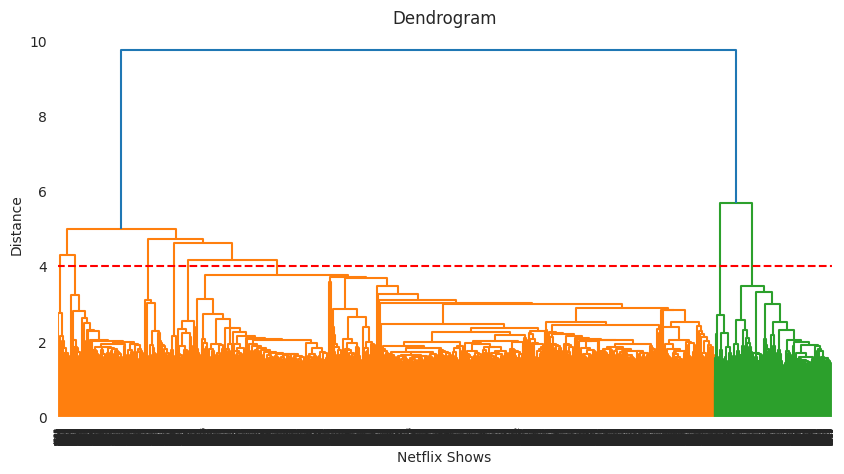

In [ ]:
# Building a dendogram to decide the number of clusters
plt.figure(figsize=(10, 5))
dend = shc.dendrogram(shc.linkage(X, method='ward'))
plt.title('Dendrogram')
plt.xlabel('Netflix Shows')
plt.ylabel('Distance')
plt.axhline(y=4, color='r', linestyle='--')

- At a distance of 4 units, 7 clusters can be built using the agglomerative clustering algorithm.

Building 7 clusters using the Agglomerative clustering algorithm:

In [ ]:
# Fitting hierarchical clustering model
hierarchical_df = AgglomerativeClustering(n_clusters=7, affinity='euclidean', linkage='ward')
hierarchical_df.fit_predict(X)

array([1, 0, 0, ..., 0, 1, 0])

In [ ]:
# Adding a hierarchical cluster number attribute
df_netflix['hierarchical_cluster'] = hierarchical_df.labels_

In [ ]:
df_netflix.sample(5)[['type', 'title', 'director', 'cast', 'country', 'rating', 'listed_in', 'description', 'hierarchical_cluster']]

,type,title,director,cast,country,rating,listed_in,description,hierarchical_cluster
2947,Movie,Iliza Shlesinger: Unveiled,Steve Paley,Iliza Shlesinger,United States,TV-MA,Stand-Up Comedy,"Here comes the bride, and she's got plenty to ...",0
7253,Movie,True: Winter Wishes,,"Michela Luci, Jamie Watson, Eric Peterson, Ann...",,TV-Y,Children & Family Movies,An ice crystal from a frosty realm is freezing...,0
3549,Movie,Lawless,John Hillcoat,"Shia LaBeouf, Jessica Chastain, Jason Clarke, ...",United States,R,Dramas,This true-to-life action saga profiles Virgini...,0
1063,Movie,Bottom of the World,Richard Sears,"Jena Malone, Douglas Smith, Ted Levine, Tamara...","Canada, United States",TV-MA,"Dramas, Independent Movies, Thrillers","En route to a fresh start in Los Angeles, youn...",0
5961,TV Show,Take My Brother Away,Han Qing,"Sun Qian, Joseph Zeng, Lv Xiao Yu, Hu Yong Tao...",China,TV-14,"International TV Shows, TV Comedies, TV Dramas",Bickering siblings Shi Miao and Shi Fen tackle...,1


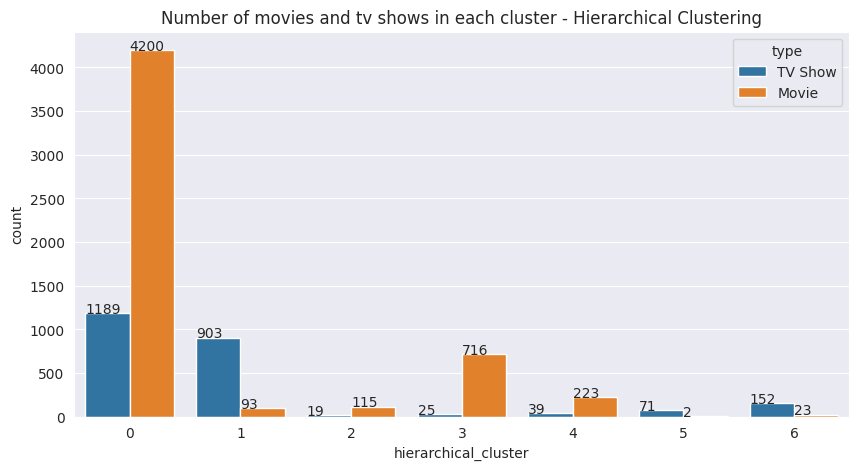

In [ ]:
# Number of movies and tv shows in each cluster
plt.figure(figsize=(10,5))
graph = sns.countplot(x='hierarchical_cluster',data=df_netflix, hue='type')
plt.title('Number of movies and tv shows in each cluster - Hierarchical Clustering')

# adding value count on the top of bar
for p in graph.patches:
    graph.annotate(format(p.get_height(), '.0f'), (p.get_x(), p.get_height()))

In [ ]:
def hierarchical_worldcloud(cluster_number, column_name):

  '''function for Building a wordcloud for the movie/shows'''

  df_netflix_wordcloud = df_netflix[['hierarchical_cluster',column_name]].dropna()
  df_netflix_wordcloud = df_netflix_wordcloud[df_netflix_wordcloud['hierarchical_cluster']==cluster_number]

  # text documents
  text = " ".join(word for word in df_netflix_wordcloud[column_name])

  # create the word cloud
  wordcloud = WordCloud(stopwords=set(STOPWORDS), background_color="white").generate(text)

  # Generate a word cloud image
  plt.imshow(wordcloud, interpolation='bilinear')
  plt.axis("off")
  plt.show()

Word Cloud on "title" column for different cluster

cluster 0


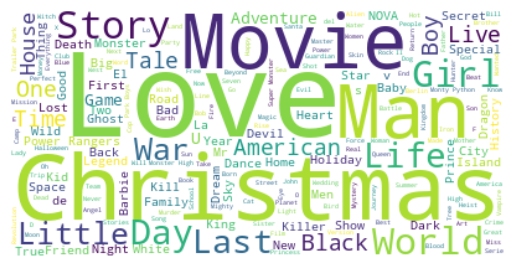

cluster 1


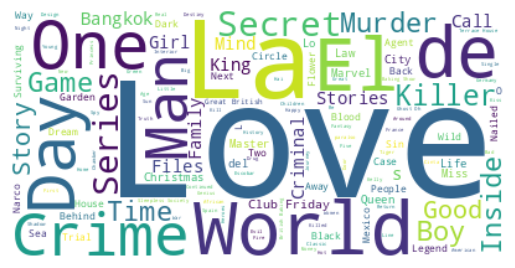

cluster 2


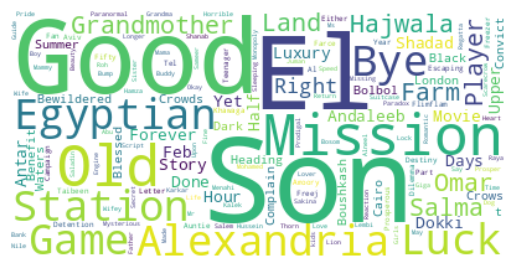

cluster 3


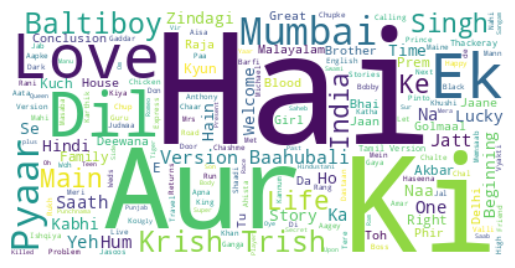

cluster 4


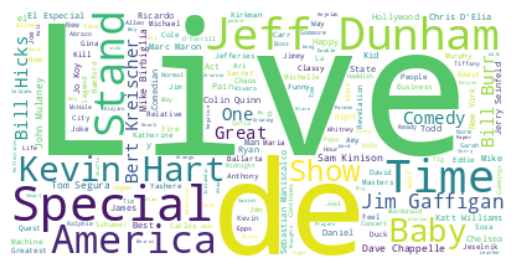

cluster 5


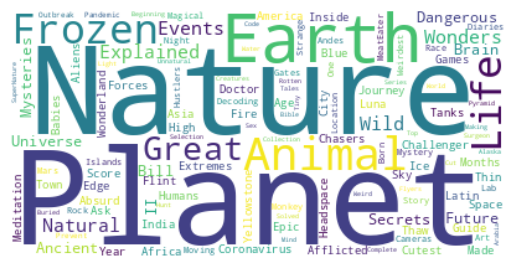

cluster 6


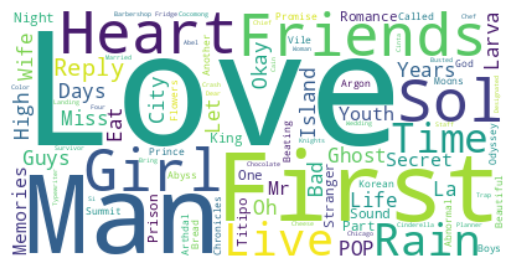

In [ ]:
for i in range(7):
  print(f'cluster {i}')
  hierarchical_worldcloud(i,'title')

Word Cloud on "description" column for different cluster

cluster 0


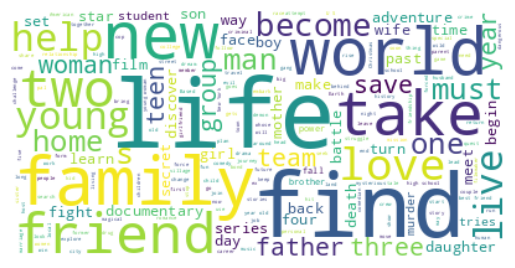

cluster 1


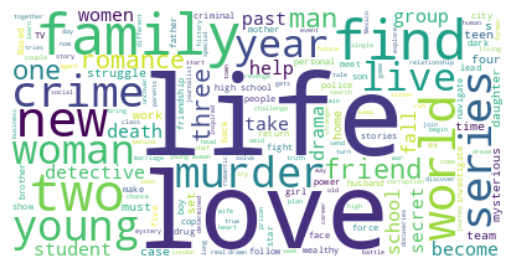

cluster 2


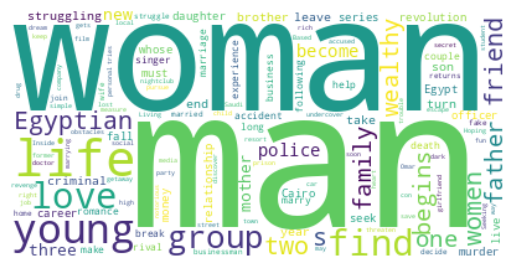

cluster 3


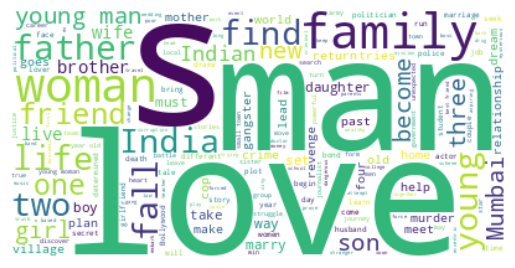

cluster 4


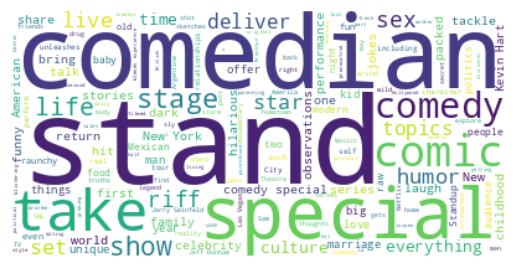

cluster 5


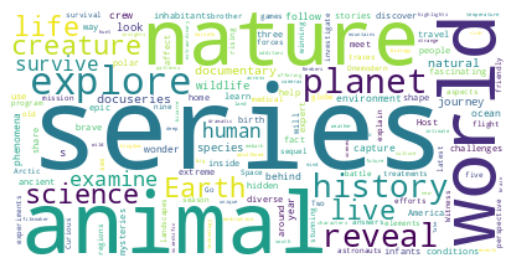

cluster 6


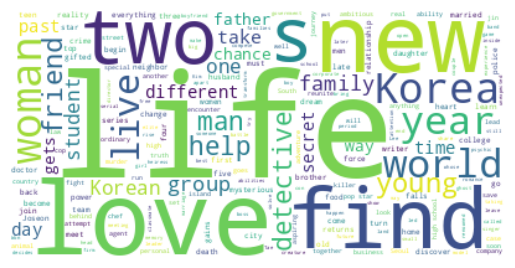

In [ ]:
for i in range(7):
    print(f'cluster {i}')
    hierarchical_worldcloud(i,'description')

Word Cloud on "cast" column for different cluster

cluster 0


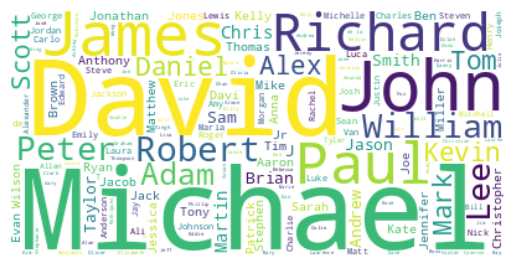

cluster 1


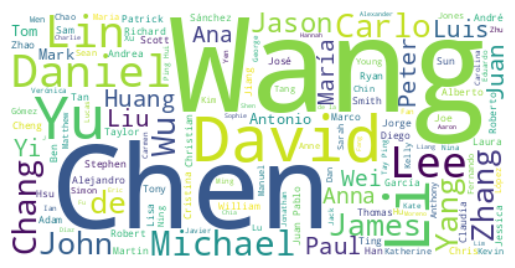

cluster 2


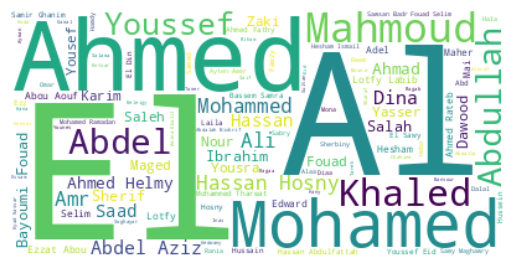

cluster 3


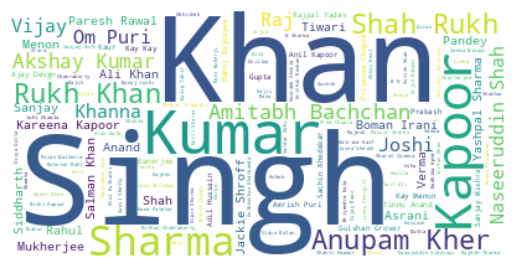

cluster 4


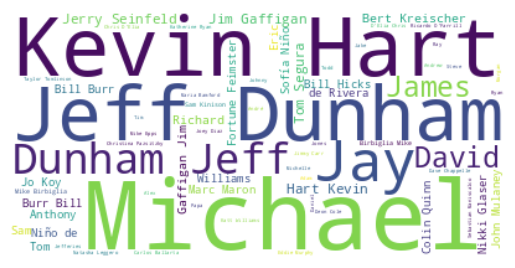

cluster 5


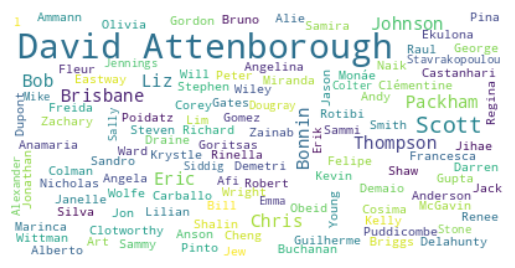

cluster 6


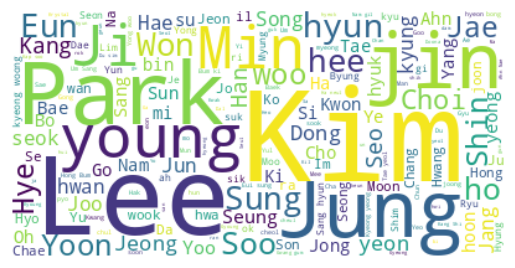

In [ ]:
for i in range(7):
    print(f'cluster {i}')
    hierarchical_worldcloud(i,'cast')

Word Cloud on "country" column for different cluster

cluster 0


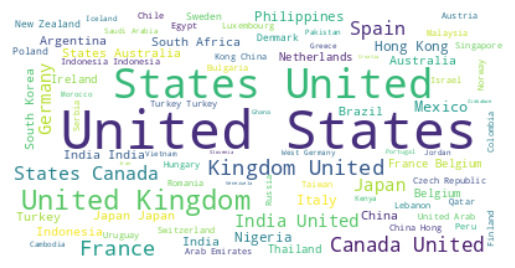

cluster 1


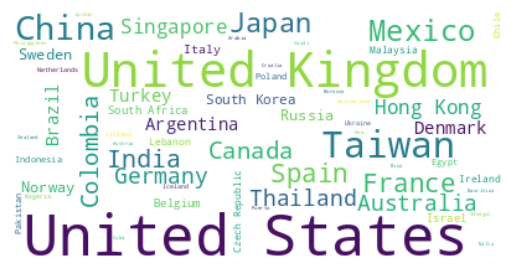

cluster 2


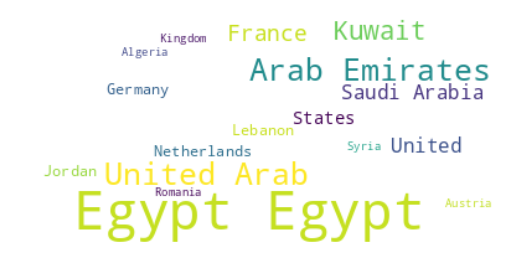

cluster 3


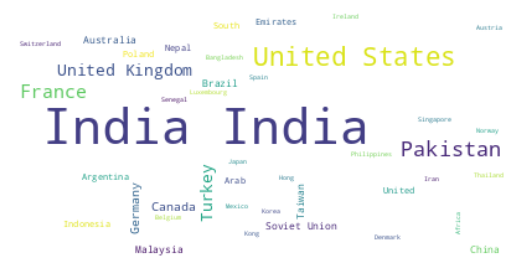

cluster 4


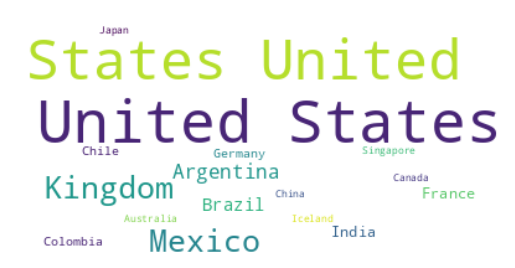

cluster 5


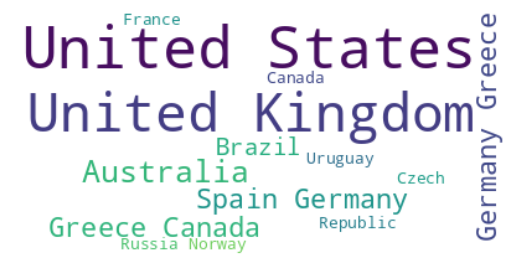

cluster 6


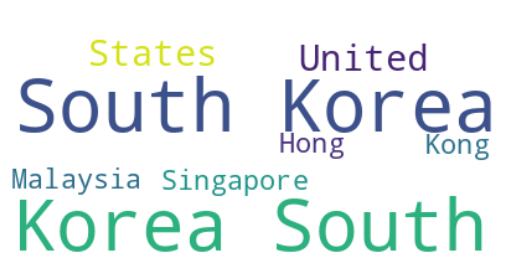

In [ ]:
for i in range(7):
    print(f'cluster {i}')
    hierarchical_worldcloud(i,'country')

Word Cloud on "listed_in" column for different cluster

cluster 0


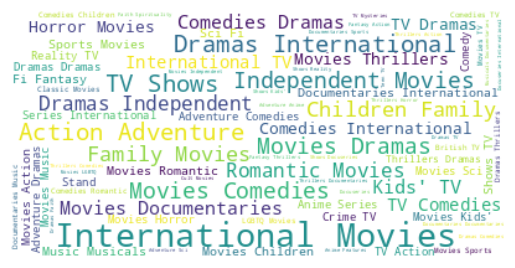

cluster 1


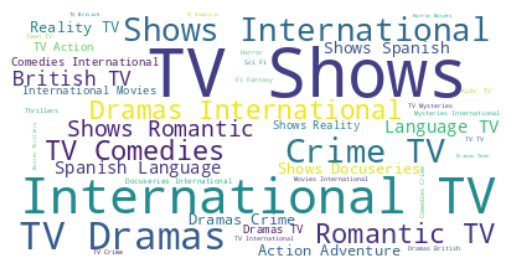

cluster 2


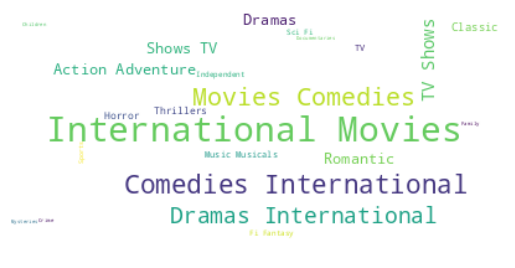

cluster 3


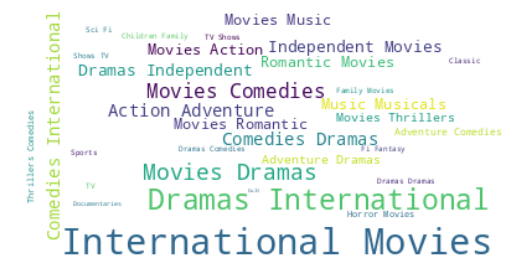

cluster 4


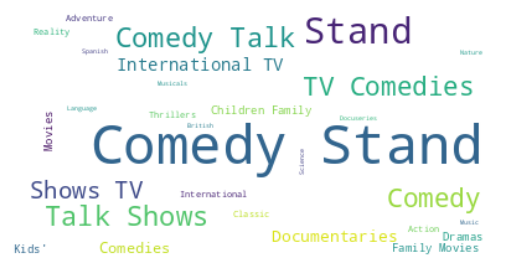

cluster 5


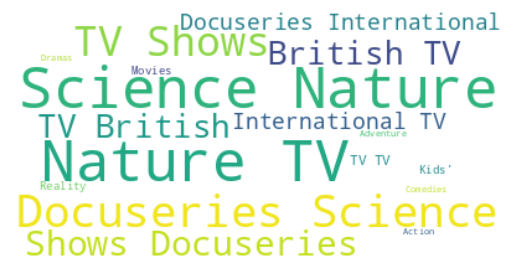

cluster 6


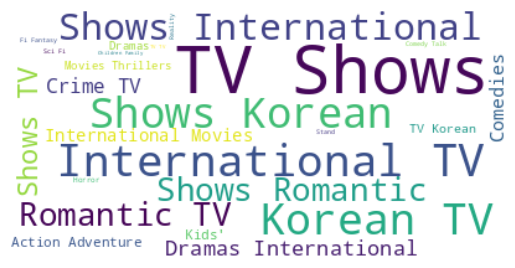

In [ ]:
for i in range(7):
    print(f'cluster {i}')
    hierarchical_worldcloud(i,'listed_in')

### Recommendation System

In [ ]:
# veryfying index
df_netflix[['show_id', 'title', 'text_data']]

,show_id,title,text_data
0,s1,3%,joão miguel bianca comparato michel gomes rodo...
1,s2,7:19,jorge michel graudemián bichir héctor bonilla ...
2,s3,23:59,gilbert chantedd chan stella chung henley hii ...
3,s4,9,shane ackerelijah wood john c reilly jennifer ...
4,s5,21,robert luketicjim sturgess kevin spacey kate b...
...,...,...,...
7782,s7783,Zozo,josef faresimad creidi antoinette turk elias g...
7783,s7784,Zubaan,mozez singhvicky kaushal sarahjane dias raagha...
7784,s7785,Zulu Man in Japan,nasty c tvmadocumentaries international movies...
7785,s7786,Zumbo's Just Desserts,adriano zumbo rachel khooaustraliatvpginternat...


- Our dataframe has a total of 7770 rows, as shown above, and the last index is 7786 due to the deletion of some rows while treating null values.

- In order to construct a content-based recommendation system, we determine the similarity score based on a specific index_id for that particular "tags" column.

- If we are unable to reset the index, there is a good chance that instead of providing an index, we will calculate cosine similarity for another index. in order to avoid this issue and properly address index when developing the recommendation system. The index was simply reset.

In [ ]:
# defining new dataframe for building recommandation system
recommender_df = df_netflix.copy()

# reseting index
recommender_df.reset_index(inplace=True)

# checking whether or not reset index properly
recommender_df[['show_id', 'title', 'text_data']]


,show_id,title,text_data
0,s1,3%,joão miguel bianca comparato michel gomes rodo...
1,s2,7:19,jorge michel graudemián bichir héctor bonilla ...
2,s3,23:59,gilbert chantedd chan stella chung henley hii ...
3,s4,9,shane ackerelijah wood john c reilly jennifer ...
4,s5,21,robert luketicjim sturgess kevin spacey kate b...
...,...,...,...
7765,s7783,Zozo,josef faresimad creidi antoinette turk elias g...
7766,s7784,Zubaan,mozez singhvicky kaushal sarahjane dias raagha...
7767,s7785,Zulu Man in Japan,nasty c tvmadocumentaries international movies...
7768,s7786,Zumbo's Just Desserts,adriano zumbo rachel khooaustraliatvpginternat...


In [ ]:
# dropping show-id and index column
recommender_df.drop(columns=['index', 'show_id'], inplace=True)

In [ ]:
# calling out transformed array independent features created from text_data(cluster) column after performing PCA for dimenssionality reduction.
X

array([[ 0.1668998 , -0.00469706, -0.0114483 , ..., -0.0026    ,
         0.01079164,  0.0147067 ],
       [-0.04478772,  0.01645849, -0.02056034, ..., -0.00256493,
        -0.0093025 , -0.00354636],
       [-0.04795862,  0.02915678,  0.04971073, ...,  0.00190726,
        -0.00992822, -0.01888509],
       ...,
       [-0.06482783,  0.00818387, -0.06525129, ..., -0.01219709,
         0.00768132, -0.00191473],
       [ 0.08758257, -0.01804604, -0.02770591, ..., -0.00377688,
         0.00721994, -0.00034214],
       [-0.07121216, -0.13954734, -0.14697579, ..., -0.01454862,
        -0.00914002, -0.01150445]])

In [ ]:
# calculate cosine similarity
similarity = cosine_similarity(X)
similarity

array([[ 1.        ,  0.10571886,  0.02105128, ..., -0.01893486,
         0.01123229, -0.02175471],
       [ 0.10571886,  1.        , -0.00420851, ...,  0.05409824,
        -0.00391398, -0.00909339],
       [ 0.02105128, -0.00420851,  1.        , ...,  0.00164464,
        -0.01266955, -0.01274836],
       ...,
       [-0.01893486,  0.05409824,  0.00164464, ...,  1.        ,
        -0.00542235,  0.03994562],
       [ 0.01123229, -0.00391398, -0.01266955, ..., -0.00542235,
         1.        , -0.01388183],
       [-0.02175471, -0.00909339, -0.01274836, ...,  0.03994562,
        -0.01388183,  1.        ]])

Cosine similarity is a measure used in content-based recommendation systems to quantify the similarity between items or documents.

Cosine similarity measures the cosine of the angle between two vectors, representing the items' feature vectors in a high-dimensional space. The closer the cosine similarity is to 1, the more similar the items are.

In [ ]:
def recommend(movie):
    '''
    This function list down top ten movies on the basis of similarity score for that perticular movie.
    '''
    print(f"If you liked '{movie}', you may also enjoy: \n")

    # find out index position
    index = recommender_df[recommender_df['title'] == movie].index[0]

    # sorting on the basis of simliarity score, In order to find out distaces from recommended one
    distances = sorted(list(enumerate(similarity[index])), reverse=True, key=lambda x:x[1])

    # listing top ten recommenaded movie
    for i in distances[1:11]:
        print(df_netflix.iloc[i[0]].title)

In [ ]:
recommend('3 Idiots')

If you liked '3 Idiots', you may also enjoy: 

PK
Ek Main Aur Ekk Tu
Rang De Basanti
For Here or to Go?
Engineering Girls
The Golden Years with Javed Akhtar
Don
Don 2
Super Nani
Sanju


In [ ]:
recommend('Phir Hera Pheri')

If you liked 'Phir Hera Pheri', you may also enjoy: 

Bhool Bhulaiyaa
Chup Chup Ke
Ready
Golmaal: Fun Unlimited
Khushi
Thank You
Hattrick
Bhagam Bhag
Hasee Toh Phasee
Humko Deewana Kar Gaye


In [ ]:
recommend('Wake Up Sid')

If you liked 'Wake Up Sid', you may also enjoy: 

Ahista Ahista
Gour Hari Dastaan: The Freedom File
Luck by Chance
Gori Tere Pyaar Mein
Tahaan
Rang De Basanti
Deadline: Sirf 24 Ghante
Kya Kehna
Judwaa
​Maj Rati ​​Keteki


In [ ]:
recommend('Jab We Met')

If you liked 'Jab We Met', you may also enjoy: 

Shimla Mirchi
Ek Jaan Hain Hum
Ek Main Aur Ekk Tu
Haider
Mubarakan
Golmaal Returns
Udta Punjab
Fida
Gori Tere Pyaar Mein
Delhi 6


# **Conclusion**

In this project, we worked on a text clustering problem wherein we had to classify/group the Netflix shows into certain clusters such that the shows within a cluster are similar to each other and the shows in different clusters are dissimilar to each other.

- The dataset contained about 7787 records with 12 attributes. Initial steps involved addressing missing values within the dataset and conducting exploratory data analysis (EDA).

- It was found that Netflix hosts more movies than TV shows on its platform, and the total number of shows added on Netflix is growing exponentially. Also, majority of the shows were produced in the United States.

- It was decided to cluster the data based on the attributes: director, cast, country, genre, rating,listed_in and description. The values in these attributes were tokenized, preprocessed, and then vectorized using TFIDF vectorizer.

- Through TFIDF Vectorization, we created a total of 10000 attributes.

- We used Principal Component Analysis (PCA) to handle the curse of dimensionality. 3000 components were able to capture more than 80% of variance, and hence, the number of components were restricted to 3000.

- We first built clusters using the K-Means Clustering algorithm, and the optimal number of clusters came out to be 5. This was obtained through the elbow method and Silhouette score analysis.
- Then clusters were built using the Agglomerative clustering algorithm, and the optimal number of clusters came out to be 7. This was obtained after visualizing the dendrogram.
- A content based recommender system was built using the similarity matrix obtained after using cosine similarity. This recommender system will make 10 recommendations to the user based on the type of show they watched.